# Machine Learning Project Checklist

1. **Frame the problem and look at the big picture.**

2. **Get the data.**

3. Explore the data to gain insights.

4. Explore many different models and short-list the best ones.

5. Fine-tune your models and combine them into a great solution.

6. Present your solution.

## 1. Frame the problem and look at the big picture

### Objective

Build an **intuitive** Machine Learning model to evaluate fair price of the given property in Budapest
- Dependent variable (predicted): **Price per squaremeter**
- Explanatory variables (features): GPS coordinates (**Latitude**, **Longitude**)

## 2. Get the data
- Python script
- Turn website into data
- Scraping data from [website](https://realestate.hu/ "Real Estate's Homepage")

## 3. Explore the data to gain insigths
- Study each attribute and its characteristics
- Visualize the data
- Study the correlations between attributes

In [1]:
import os
REPO_DIR = os.path.join(os.environ['USERPROFILE'], 'repos')
PROJ_DIR = os.path.join(REPO_DIR, 'real_estate_machine_learning')
os.chdir(PROJ_DIR)

In [2]:
SRC_DIR = './src'
import sys
sys.path.append(SRC_DIR)
import translation
import overpy
import pickle
import re
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV, train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn import linear_model
from sklearn.pipeline import Pipeline
import seaborn as sns
from scipy.stats import normaltest
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap 
from utils import *
%matplotlib inline

In [49]:
DATA_DIR = './data'
RAW_DIR = os.path.join(DATA_DIR, 'raw')
IMG_DIR = './img'
MODEL_DIR = './model'
INPUT_DIR = '../real_estate_hungary/output'
FILENAME = 'ForSaleRent_20181101.csv'
INPUT_FILEPATH=os.path.join(INPUT_DIR, FILENAME)

In [4]:
na_hun_equivalent='nincs megadva'

### Load scraped data

In [5]:
raw=pd.read_csv(INPUT_FILEPATH, encoding='utf8', na_values=na_hun_equivalent)

### Translation from Hungarian to English

In [6]:
raw=translation.transform_naming(raw)

### Data structure/columns
Three categories:
1. Unique ID
2. Possible features
3. Technical columns

In [7]:
raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55146 entries, 0 to 55145
Data columns (total 60 columns):
address                     55120 non-null object
accessibility               14456 non-null object
batch_num                   55146 non-null int64
ceiling_height              37722 non-null object
buses                       36823 non-null object
buses_count                 36823 non-null float64
furnished                   8593 non-null object
cluster_id                  55146 non-null object
property_id                 55146 non-null int64
desc                        54531 non-null object
city_district               55146 non-null int64
smoking                     4822 non-null object
floors                      50258 non-null object
energy_perf_cert            2809 non-null object
balcony                     23573 non-null object
bath_and_wc                 29760 non-null object
type_of_heating             49418 non-null object
equipped                    7926 non-null obje

In [8]:
composite_id=['property_id', 'timestamp']

In [9]:
technical=['property_url', 'cluster_id', 'batch_num', 'page_num', 'max_page', 'max_listing', 'is_ad_active']

In [10]:
possible_features=raw.columns[~raw.columns.isin(technical)&~raw.columns.isin(composite_id)].tolist()

### Drop duplicated records

In [11]:
unique_records=raw[[composite_id[0]]+possible_features].drop_duplicates()
unique_records_idx=unique_records.index
total_records=len(raw)
unique_total_ratio=len(unique_records)/total_records
print('Total number of records: {0:,}'.format(total_records))
print('Unique record ratio is {0:%}'.format(unique_total_ratio))

Total number of records: 55,146
Unique record ratio is 97.325282%


In [12]:
u_raw=raw.loc[unique_records_idx, possible_features + composite_id]

### Adding unique id column
- Composed from **property_id** and **timestamp**

In [13]:
ts_fmt='%Y-%m-%d %H:%M:%S.%f'
u_raw['id']=u_raw['property_id']+u_raw['timestamp'].apply(lambda ts: datetime.datetime.strptime(ts, ts_fmt).timestamp())

In [14]:
u_raw.loc[:,possible_features].head()

,address,accessibility,ceiling_height,buses,buses_count,furnished,desc,city_district,smoking,floors,...,trolley_buses,trolley_buses_count,listing_type,orientation,trams,trams_count,all_night_services,all_night_services_count,year_built,building_floors
0,Budai Bolero II,igen,NaN,103|133E|33,3.0,NaN,| Exkluzív otthon az Ön igényeire szabva! A Bu...,11,NaN,10,...,NaN,NaN,for-sale,nyugat,1,1.0,NaN,NaN,2019,10
1,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,földszint,...,NaN,NaN,for-sale,északnyugat,1|14,2.0,914|914A,2.0,NaN,5
2,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,2,...,NaN,NaN,for-sale,délnyugat,1|14,2.0,914|914A,2.0,2018,5
3,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,1,...,NaN,NaN,for-sale,északnyugat,1|14,2.0,914|914A,2.0,2018,5
4,Csata utca 30.,NaN,3 m-nél alacsonyabb,14|32|105,3.0,NaN,| XIII kerület közkedvelt részén az Árpád-hí...,13,NaN,5,...,NaN,NaN,for-sale,északkelet,1|14,2.0,914|914A,2.0,2018,5


### Available listing types
- for-sale
- for-rent

In [15]:
sale_flt=u_raw.listing_type=='for-sale'
rent_flt=u_raw.listing_type=='for-rent'

### Missing values

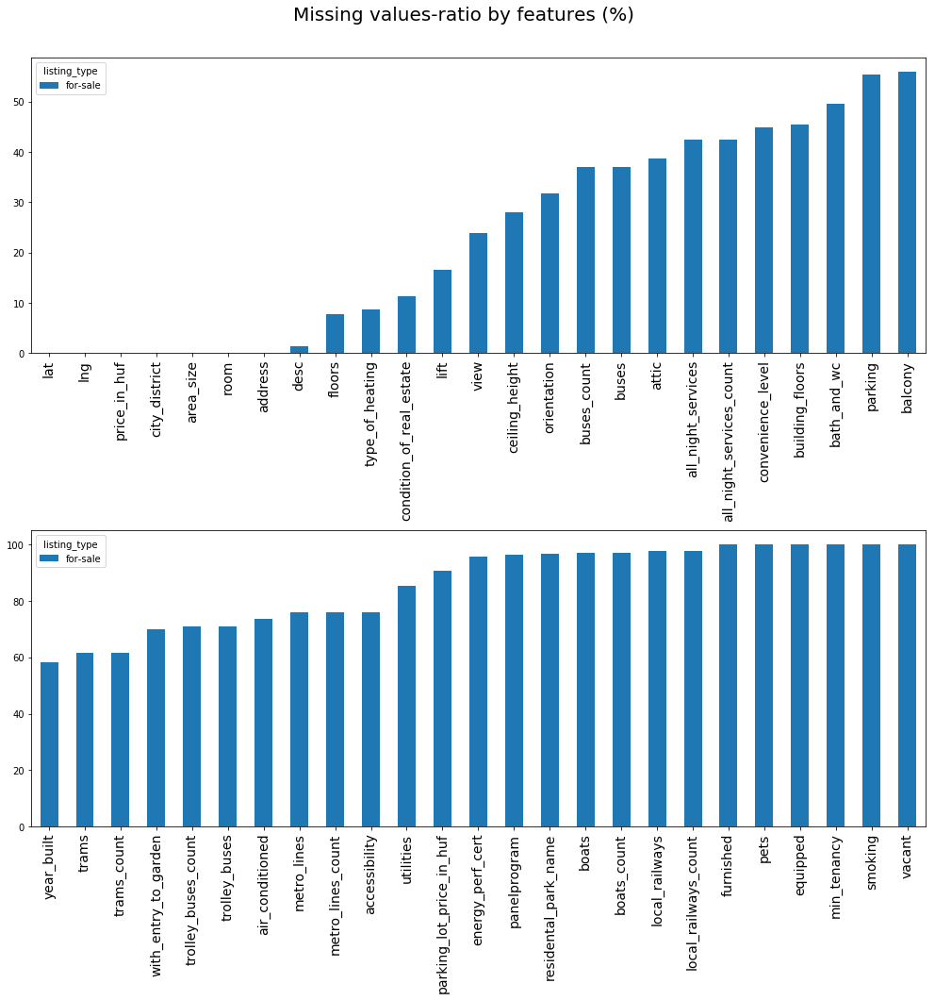

In [16]:
plot_na_ratio(u_raw.loc[sale_flt, possible_features], grouping='listing_type', dest_dir=IMG_DIR)
plt.show()

### Handling missing values
1. No action, using only fully represented variables
2. Impute with mean, median, mode
3. Model different features leveraging of other variables
4. Using *Natural Language Processing* on property description and combine with the 3rd option 

- Fully represented variables:

In [17]:
fully_repr=['id', 'lng', 'lat', 'price_in_huf', 'area_size', 'room', 'city_district', 'address', 'listing_type'] + ['residental_park_name',]

In [18]:
listings=u_raw.loc[:, fully_repr].copy()

In [19]:
listings.dtypes

id                      float64
lng                     float64
lat                     float64
price_in_huf             object
area_size                object
room                     object
city_district             int64
address                  object
listing_type             object
residental_park_name     object
dtype: object

In [20]:
listings.head()

,id,lng,lat,price_in_huf,area_size,room,city_district,address,listing_type,residental_park_name
0,1.567544e+09,19.048690,47.460680,69.9 millió Ft,92 m²,3 + 1 fél,11,Budai Bolero II,for-sale,Budai Bolero II
1,1.565945e+09,19.079060,47.529858,50.3 millió Ft,75 m²,3,13,Csata utca 30.,for-sale,NaN
2,1.566792e+09,19.078869,47.529730,49.5 millió Ft,75 m²,3,13,Csata utca 30.,for-sale,NaN
3,1.568972e+09,19.079060,47.529858,46.1 millió Ft,71 m²,3,13,Csata utca 30.,for-sale,NaN
4,1.568226e+09,19.079060,47.529858,62.9 millió Ft,77 m²,3,13,Csata utca 30.,for-sale,NaN


### Convert strings to numeric
- Price - three categories:
    1. Billion (milliárd)
    2. Million (millió)
    3. Hungarian Forint (Ft)<br><br>
- Area size:
    - Remove m$^2$ (square meter)<br><br>
- Price per squaremeter:
    $\frac{price}{area}$<br><br>
- Number of rooms - splitting into two category
    1. Number of full rooms (room >12 m$^2$)
    2. Number of half rooms (room <12 m$^2$)
    3. Adding total number of rooms

In [21]:
listings['price_in_huf']=raw.price_in_huf.apply(extract_num, thousand_eq='ezer', million_eq='millió', billion_eq='milliárd')
listings['area_size']=raw.area_size.apply(extract_num)
listings['room_lt_12_sqm']=raw.room.apply(lambda x: extract_num(x.split('+')[1]) if '+' in x else 0)
listings['room_ge_12_sqm']=raw.room.apply(lambda x: extract_num(x.split('+')[0]))
listings['room_total']=listings['room_ge_12_sqm']+listings['room_lt_12_sqm']
listings['price_per_sqm']=listings['price_in_huf']/listings['area_size']

In [22]:
listings[['lng', 'lat', 'price_in_huf', 'area_size', 'price_per_sqm', 'room', 'room_lt_12_sqm', 'room_ge_12_sqm', 'room_total']].head(10)

,lng,lat,price_in_huf,area_size,price_per_sqm,room,room_lt_12_sqm,room_ge_12_sqm,room_total
0,19.048690,47.460680,69900000.0,92.0,759782.608696,3 + 1 fél,1.0,3.0,4.0
1,19.079060,47.529858,50300000.0,75.0,670666.666667,3,0.0,3.0,3.0
2,19.078869,47.529730,49500000.0,75.0,660000.000000,3,0.0,3.0,3.0
3,19.079060,47.529858,46100000.0,71.0,649295.774648,3,0.0,3.0,3.0
4,19.079060,47.529858,62900000.0,77.0,816883.116883,3,0.0,3.0,3.0
5,19.078869,47.529730,49950000.0,75.0,666000.000000,3,0.0,3.0,3.0
6,19.079060,47.529858,44150000.0,67.0,658955.223881,1 + 2 fél,2.0,1.0,3.0
7,19.064398,47.538403,39050000.0,50.0,781000.000000,2,0.0,2.0,2.0
8,19.064398,47.538403,45200000.0,61.0,740983.606557,3,0.0,3.0,3.0
9,19.064398,47.538403,57930000.0,77.0,752337.662338,4,0.0,4.0,4.0


In [23]:
listings.drop(axis=1, labels=['room', 'room_lt_12_sqm', 'room_ge_12_sqm'], inplace=True)

---

### Split listings into listing types

In [24]:
sale, rent = listings[sale_flt], listings[rent_flt]

### Split *for-sale* dataset into training and test set
- 20% of the data is used for model validation

In [25]:
train_sale, test_sale = split_train_test_by_hash(sale, test_ratio=0.2, id_column='id')

In [26]:
train_sale_ratio=len(train_sale)/(len(train_sale)+len(test_sale))
print('Number of records in training set: {0:,}'.format(len(train_sale)))
print('Number of records in training set to total records {0:%}'.format(train_sale_ratio))

Number of records in training set: 34,605
Number of records in training set to total records 79.661602%


## Data exploration

In [27]:
train_sale.describe()

,id,lng,lat,price_in_huf,area_size,city_district,room_total,price_per_sqm
count,3.460500e+04,34605.000000,34605.000000,3.460500e+04,34605.000000,34605.000000,34605.000000,3.460500e+04
mean,1.568493e+09,19.070466,47.504952,5.393875e+07,72.705274,9.056495,2.677908,7.298856e+05
std,1.394357e+06,0.046005,0.034070,4.727107e+07,54.358514,5.026087,1.448156,2.674743e+05
min,1.544340e+09,18.938150,47.377407,2.000000e+06,8.000000,1.000000,1.000000,2.400000e+04
25%,1.568472e+09,19.043684,47.488250,2.890000e+07,49.000000,5.000000,2.000000,5.520833e+05
50%,1.569002e+09,19.066221,47.504910,4.280000e+07,64.000000,8.000000,3.000000,6.901408e+05
75%,1.569226e+09,19.085848,47.522550,6.490000e+07,87.000000,13.000000,3.000000,8.541667e+05
max,1.569351e+09,19.317210,47.610500,3.410000e+09,5800.000000,23.000000,64.000000,4.000000e+06


In [28]:
num_feat=[i for i in listings if (listings[i].dtype!=object) & (i!='id')]

### Plotting histograms to check distribution

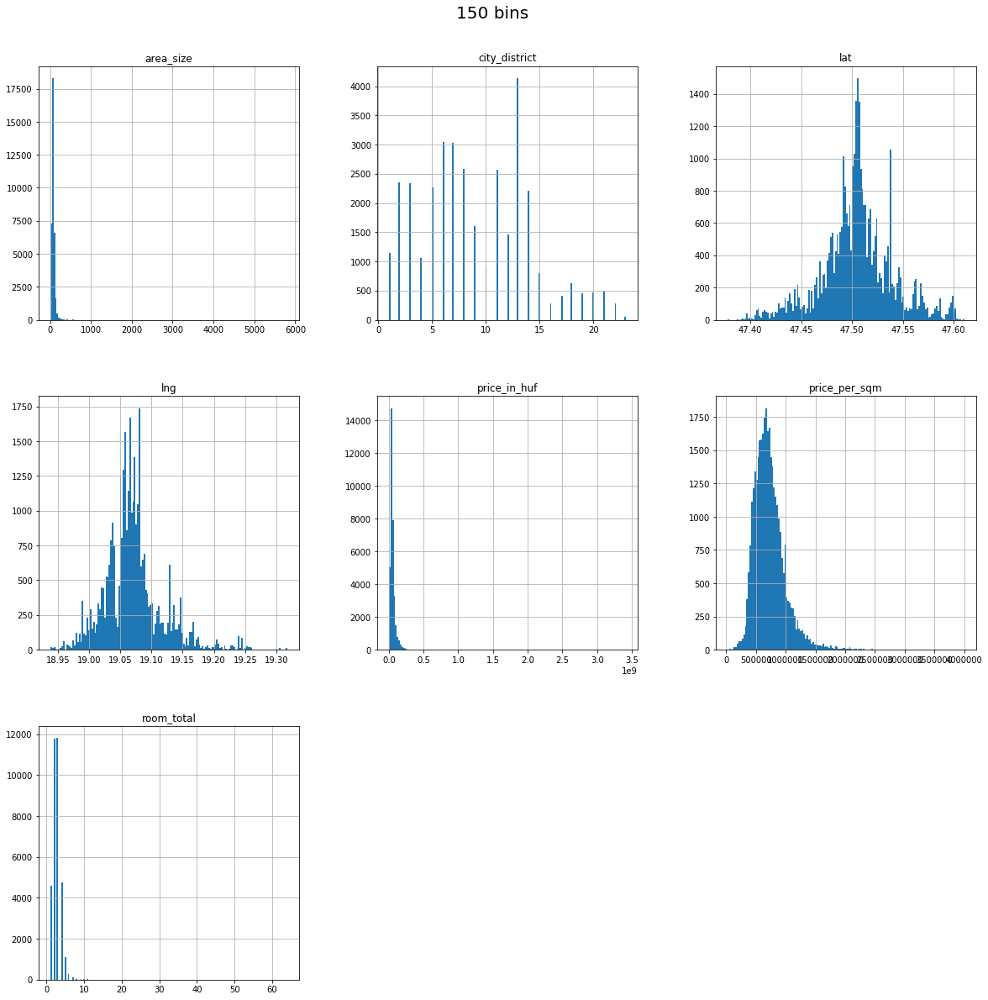

In [29]:
bins=150
train_sale[num_feat].hist(bins=bins, figsize=(20,20))
plt.suptitle('{} bins'.format(bins), fontsize=20, weight=15, y=0.93)
plt.savefig('{0}/{1}_bins_{2}{3}'.format(IMG_DIR, 'histograms', bins, '.png'))

### Data transformation
- Log-Normal Distribution

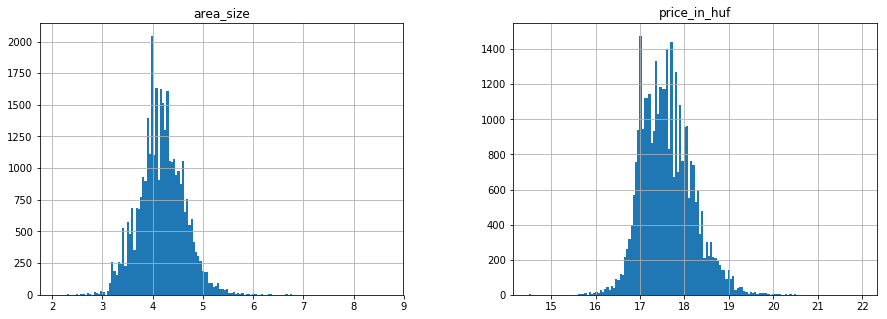

In [30]:
train_sale[['price_in_huf', 'area_size']].apply(np.log).hist(bins=bins, figsize=(15,5))
plt.show()

### Adding transformed columns

In [31]:
train_sale['log_price_in_huf']=train_sale.price_in_huf.apply(np.log)
train_sale['log_area_size']=train_sale.area_size.apply(np.log)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


### Cross correlation between variables

In [32]:
num_feat=[i for i in train_sale if (train_sale[i].dtype!=object) & (i not in ['id'])]

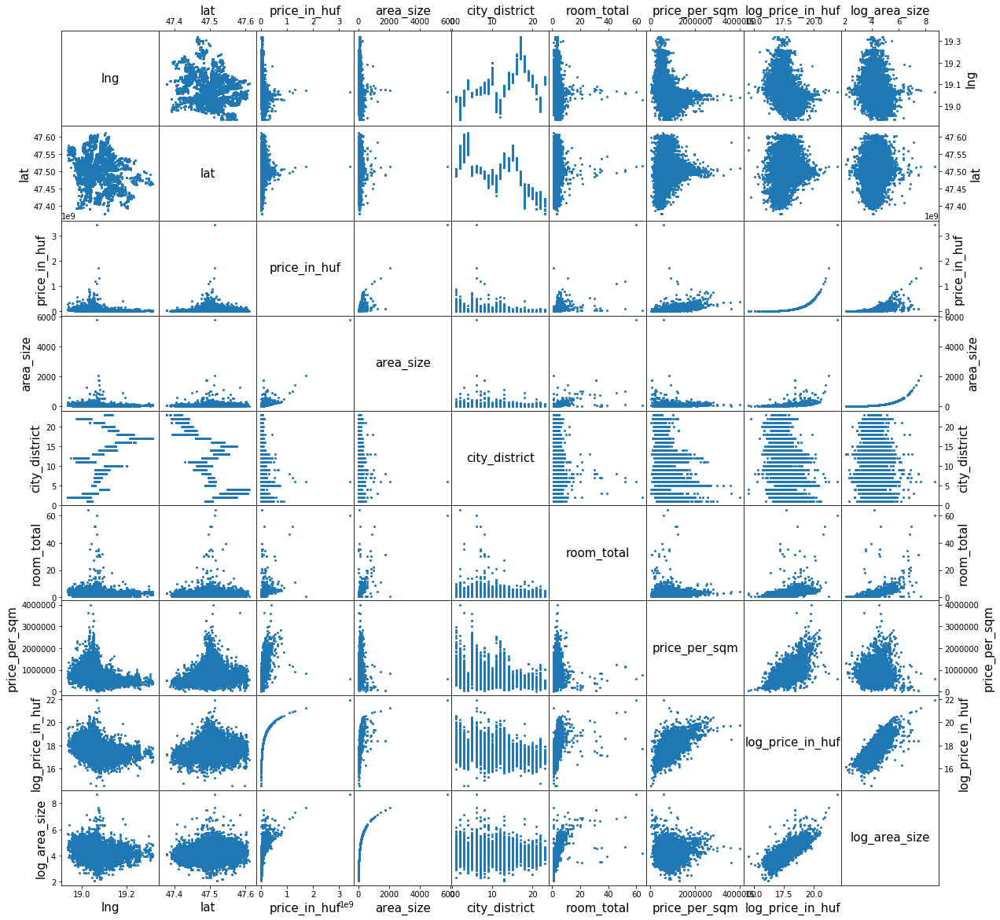

In [33]:
df=train_sale[num_feat].copy()
plot_scatter_matrix(df)
plt.show()

In [34]:
corr=df.corr()
corr.style.background_gradient()

,lng,lat,price_in_huf,area_size,city_district,room_total,price_per_sqm,log_price_in_huf,log_area_size
lng,1,-0.129625,-0.283739,-0.145639,0.503537,-0.103804,-0.381976,-0.423186,-0.214539
lat,-0.129625,1,0.0489879,0.0339724,-0.462426,0.0412864,0.0682869,0.10158,0.0518328
price_in_huf,-0.283739,0.0489879,1,0.763196,-0.237139,0.533076,0.557853,0.799837,0.645878
area_size,-0.145639,0.0339724,0.763196,1,-0.112529,0.672143,0.0599909,0.565808,0.714505
city_district,0.503537,-0.462426,-0.237139,-0.112529,1,-0.0613272,-0.338669,-0.342578,-0.158042
room_total,-0.103804,0.0412864,0.533076,0.672143,-0.0613272,1,0.0156102,0.525929,0.685721
price_per_sqm,-0.381976,0.0682869,0.557853,0.0599909,-0.338669,0.0156102,1,0.627682,0.0714698
log_price_in_huf,-0.423186,0.10158,0.799837,0.565808,-0.342578,0.525929,0.627682,1,0.799596
log_area_size,-0.214539,0.0518328,0.645878,0.714505,-0.158042,0.685721,0.0714698,0.799596,1


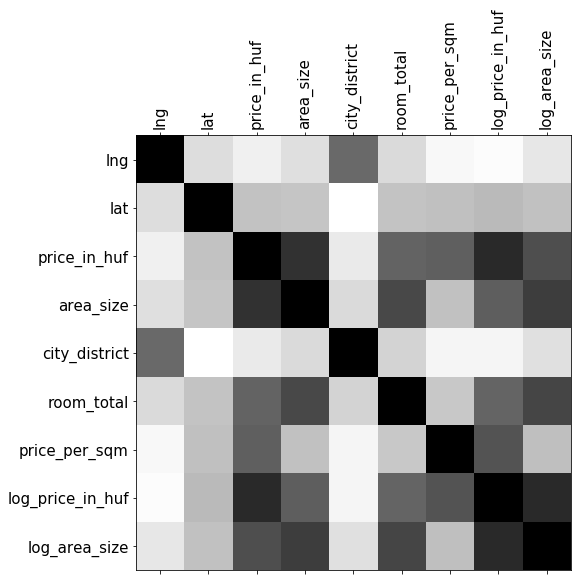

In [35]:
fig=plt.figure(figsize=(8,8))
ax=fig.gca()
ax.matshow(df.corr(), cmap='Greys')
ax.xaxis.set_ticklabels(ticklabels=['']+df.corr().columns.tolist(), rotation=90, fontsize=15)
ax.yaxis.set_ticklabels(ticklabels=['']+df.corr().columns.tolist(), fontsize=15)
plt.show()

### Longitude, Latitude - Scale: Interval

- Measurement scales
    - Nominal, category
    - Ordinal
    - Interval
    - Ratio

In [36]:
min_gps=train_sale[['lng', 'lat']].min()
max_gps=train_sale[['lng', 'lat']].max()
pic_ratio=(max_gps['lat']-min_gps['lat'])/(max_gps['lng']-min_gps['lng'])
print(pic_ratio)

0.6149237587717099


In [37]:
opt_fig_size=calc_fig_size(pic_ratio, 2.5)

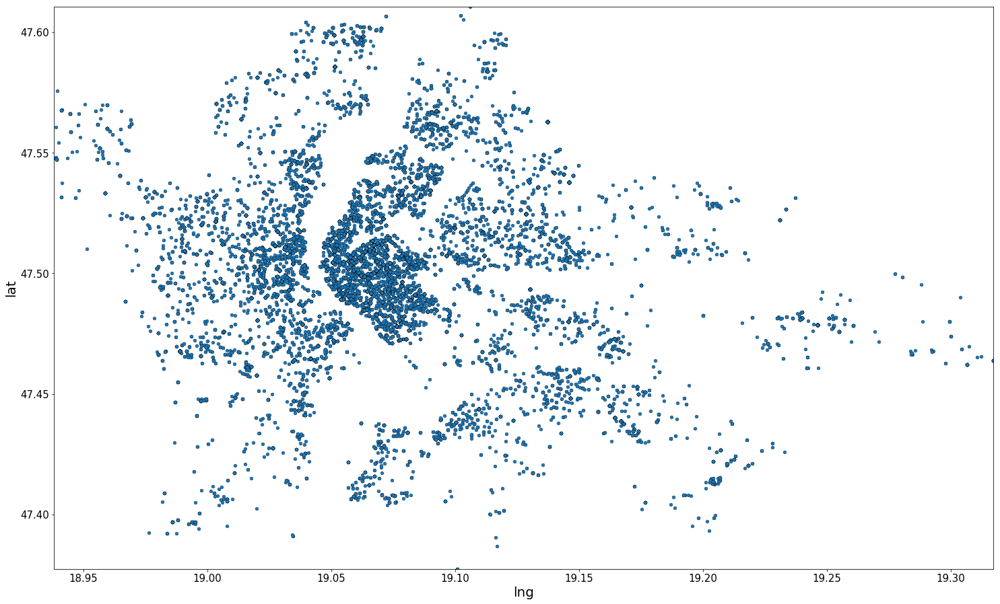

In [38]:
ax=plt.gca()
train_sale[['lng', 'lat']].plot(kind='scatter', x='lng', y='lat', ax=ax, s=25, alpha=1, linewidth=0.25, edgecolor='Black', figsize=opt_fig_size, xlim=(min_gps['lng'], max_gps['lng']), ylim=(min_gps['lat'], max_gps['lat']))
ax.xaxis.set_label_text('lng', fontdict={'fontsize':20})
ax.axes.tick_params(labelsize=15)
ax.yaxis.set_label_text('lat', fontdict={'fontsize':20})
plt.show()

- Adding map to the scatter plot

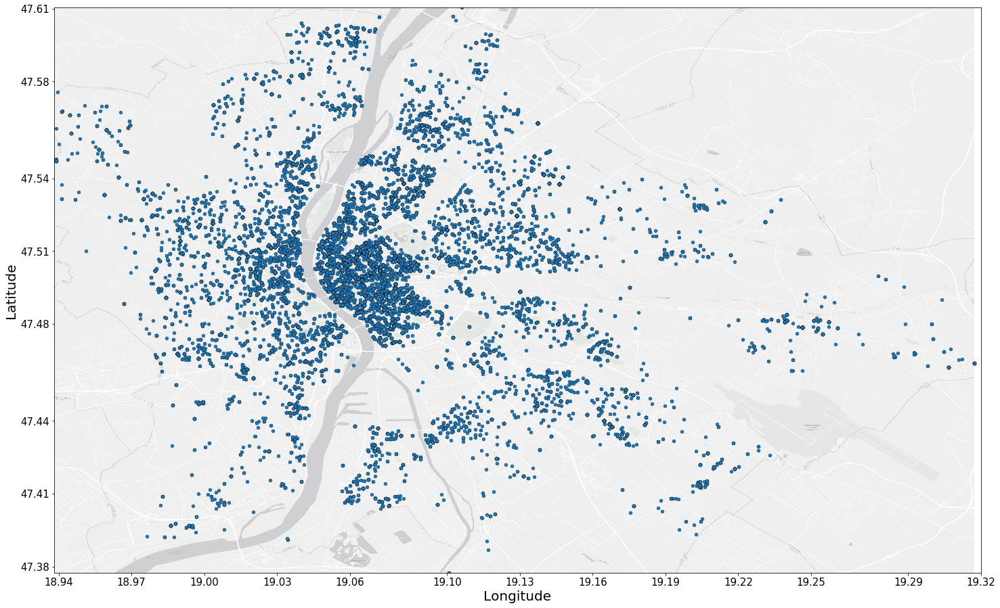

In [39]:
plot_scatter_map(x=train_sale.lng, y=train_sale.lat, xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, dpi=160)
plt.show()

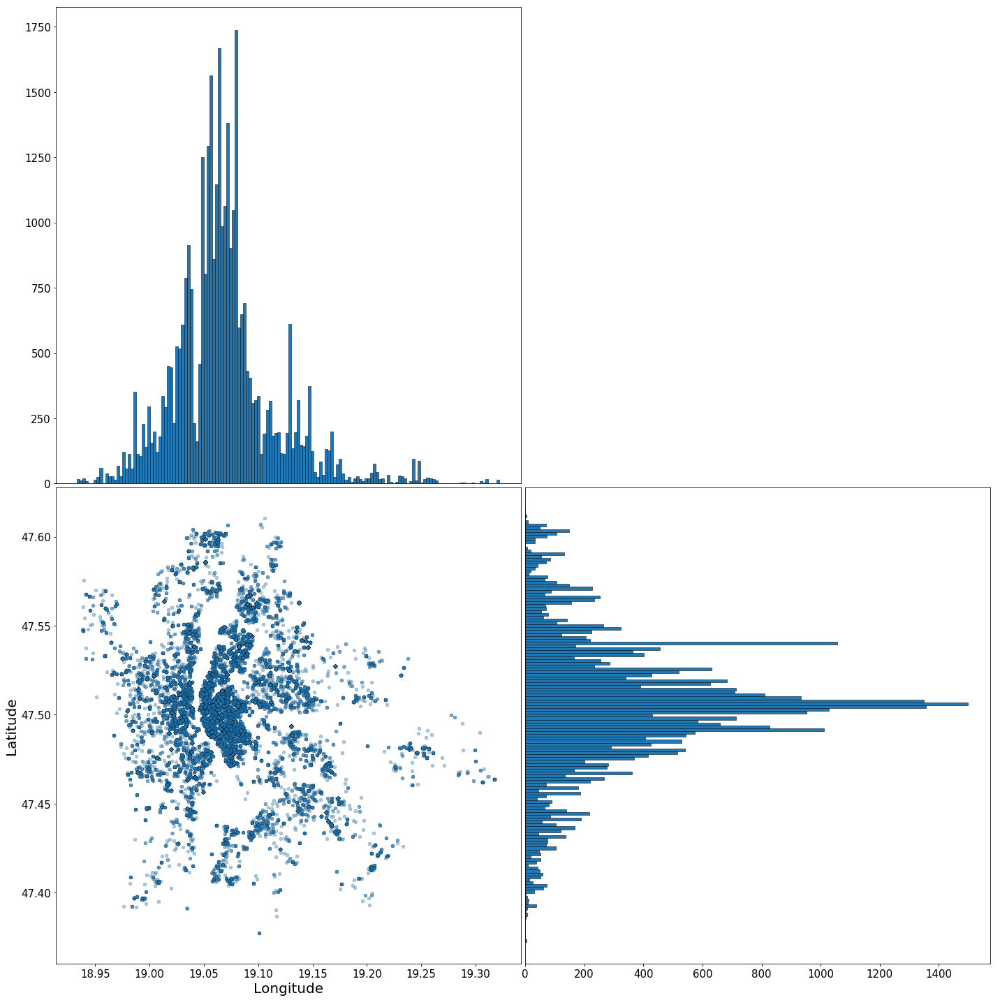

In [40]:
plot_sca_hist(train_sale[['lng', 'lat']], 'lng', 'lat', bins, 'Longitude', 'Latitude')
plt.show()

Data distributed by districts

In [41]:
rnd_colors = load_pkl(os.path.join(DATA_DIR, 'colors_23_2'))

In [42]:
rnd_colors=np.random.choice(list(mpl.cm.colors.cnames.keys()), size=23, replace=False)

In [43]:
# plt.style.use('ggplot')

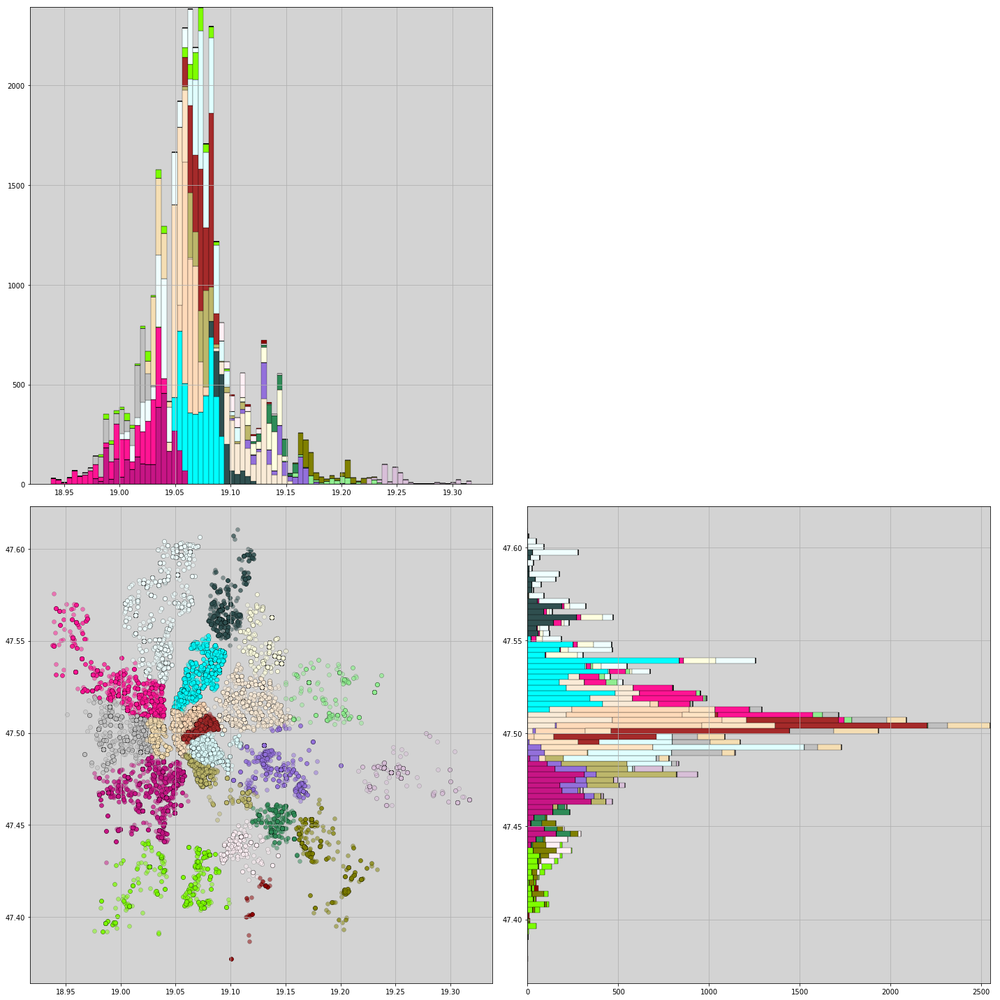

In [44]:
fig, axs = plot_sca_stackedhist(train_sale, 'lng', 'lat', 'city_district', rnd_colors)
plt.show()

Top 10 number of addresses pointing to the same GPS coordinates:

In [45]:
gps_count=train_sale[['lng', 'lat', 'address']].groupby(['lng', 'lat']).count().sort_values('address', ascending=False)
gps_count.head(10)

,,address
lng,lat,
19.082080,47.538097,512
19.066608,47.513428,329
19.058195,47.505077,282
19.054825,47.491750,268
19.050583,47.504430,259
19.128630,47.524723,258
19.071003,47.522550,206
19.072440,47.501980,196
19.080984,47.505295,186


In [46]:
address_count=train_sale[['lng', 'lat', 'address']].groupby(['address']).count().sort_values(['lng', 'lat'], ascending=False)
address_count.head()

,lng,lat
address,,
Angyalföld,558,558
Külső-Terézváros,329,329
Alsórákos,302,302
Belső-Terézváros,282,282
Király utca,272,272


#### GPS Coordinates
The issue with the gps coordinates is that if the user has not specified the exact address only the district then gps coordinates point to the center of the district, consequently longitude and latitude pairs are not accurate enough.  
**Solution**: remove these records, since they include too broad set of properties.<br><br>
Four homogeneity levels have been identified:
    1. Fully specified address (contains street number, street name) e.g. Király utca 13.
    2. Residental park is defined e.g. Greenside
    3. Street name is given e.g. Mester utca
    4. Subdistrict name is provided e.g. Aquincum

- Fully specified address

In [47]:
public_domains=get_public_domain_names()

In [50]:
public_domains=load_public_domain_names(os.path.join(RAW_DIR, 'public_domains_2015_09_07.txt'))

In [51]:
street_num_ptrn='|'.join(['.*{}.*\d'.format(d) for d in public_domains])
street_num_mask=train_sale.address.apply(lambda a: bool(re.match(string=str(a), pattern=street_num_ptrn)))
street_num_mask.sum()

2084

In [52]:
train_sale[street_num_mask].tail()

,id,lng,lat,price_in_huf,area_size,city_district,address,listing_type,residental_park_name,room_total,price_per_sqm,log_price_in_huf,log_area_size
55006,1.562761e+09,19.062881,47.495396,64940000.0,72.0,7,Dohány utca 9.,for-sale,NaN,3.0,901944.444444,17.988974,4.276666
55063,1.562420e+09,19.075905,47.488605,45500000.0,124.0,8,Hock János utca 3.,for-sale,NaN,4.0,366935.483871,17.633223,4.820282
55079,1.562071e+09,19.204250,47.414990,50000000.0,91.0,18,Fenyőfa utca 1.,for-sale,NaN,3.0,549450.549451,17.727534,4.510860
55082,1.562030e+09,19.136728,47.490860,8000000.0,54.0,10,Kőrösi Csoma Sándor út 40.,for-sale,NaN,2.0,148148.148148,15.894952,3.988984
55086,1.561964e+09,18.992636,47.479630,40500000.0,58.0,11,Törökbálinti út 24.,for-sale,NaN,3.0,698275.862069,17.516813,4.060443


- Residental park

In [53]:
residental_park_mask=train_sale.loc[:,'residental_park_name'].notnull()
residental_park_mask.sum()

1096

- Street name

In [54]:
pub_domain_ptrn='|'.join(['.* {}$'.format(d) for d in public_domains])
public_domains_mask=train_sale.address.apply(lambda a: bool(re.match(string=str(a), pattern=pub_domain_ptrn)))
public_domains_mask.sum()

21308

In [55]:
train_sale[public_domains_mask].tail()

,id,lng,lat,price_in_huf,area_size,city_district,address,listing_type,residental_park_name,room_total,price_per_sqm,log_price_in_huf,log_area_size
55134,1.547647e+09,19.023384,47.517258,220000000.0,194.0,2,Bimbó út,for-sale,NaN,5.0,1.134021e+06,19.209138,5.267858
55135,1.547506e+09,19.032919,47.525936,152000000.0,295.0,2,Felhévízi utca,for-sale,NaN,6.0,5.152542e+05,18.839391,5.686975
55136,1.547478e+09,19.062782,47.511730,47900000.0,84.0,6,Podmaniczky utca,for-sale,NaN,2.0,5.702381e+05,17.684626,4.430817
55137,1.547459e+09,19.052720,47.501560,179000000.0,109.0,5,Hercegprímás utca,for-sale,NaN,3.0,1.642202e+06,19.002896,4.691348
55140,1.546887e+09,19.050991,47.496605,550000000.0,280.0,5,Vörösmarty tér,for-sale,NaN,5.0,1.964286e+06,20.125429,5.634790


In [56]:
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'address'].count()

24392

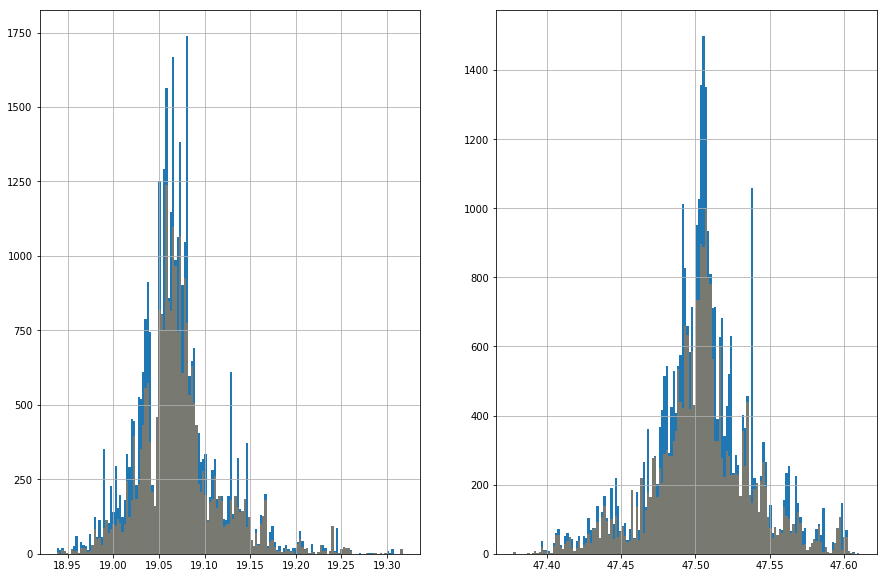

In [57]:
bins=150
fig, axs = plt.subplots(1,2)
fig.set_size_inches(30,20)
train_sale.loc[:, 'lng'].hist(bins=bins, ax=axs[0])
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'lng'].hist(figsize=(15,10), bins=bins, ax=axs[0], alpha=0.4)
train_sale.loc[:, 'lat'].hist(bins=bins, ax=axs[1])
train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'lat'].hist(figsize=(15,10), bins=bins, ax=axs[1], alpha=0.4)

In [58]:
normaltest(train_sale.loc[street_num_mask|residental_park_mask|public_domains_mask, 'price_per_sqm'])

NormaltestResult(statistic=9735.969478637397, pvalue=0.0)

### Removing outliers
- Standardization:
    - Subtracting mean (centered)
    - Dividing by standard deviation (scaled)

In [59]:
df=train_sale.loc[:, num_feat].copy()

In [60]:
scaler=StandardScaler()

In [61]:
st_arr=scaler.fit_transform(df)

In [62]:
st_df=pd.DataFrame(st_arr, columns=df.columns)

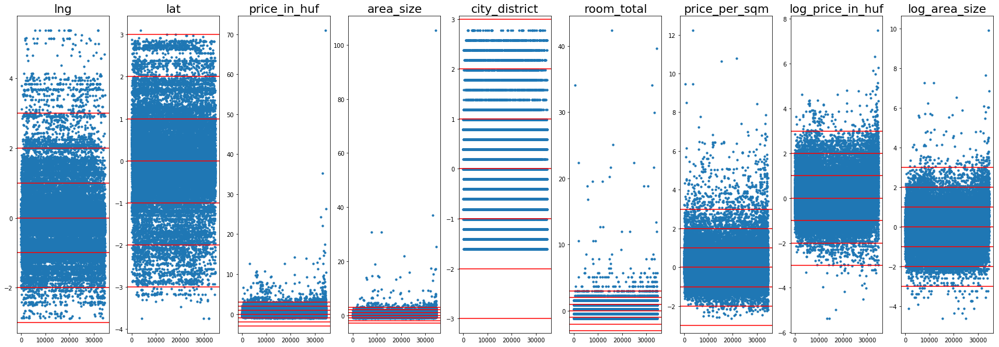

In [63]:
plot_outliers(st_df, n_std=3)
plt.show()

### Decide the n sigma from mean

In [64]:
ratios=[]
for sigma in np.arange(10, 1, -0.25):
    price_per_sqm_mask=(st_df.price_per_sqm.values<=sigma)&(st_df.price_per_sqm.values>=sigma*(-1))
    log_price_mask=(st_df.log_price_in_huf.values<=sigma)&(st_df.log_price_in_huf.values>=sigma*(-1))
    log_area_mask=(st_df.log_area_size.values<=sigma)&(st_df.log_area_size.values>=sigma*(-1))
    lng_mask=(st_df.lng.values<=sigma)&(st_df.lng.values>=sigma*(-1))
    lat_mask=(st_df.lat.values<=sigma)&(st_df.lat.values>=sigma*(-1))
    total_records=len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask),num_feat])
    filtered_records=len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask)&price_per_sqm_mask&log_price_mask&log_area_mask&lng_mask&lat_mask, num_feat])
    ratio=1-(filtered_records/total_records)
    ratios.append(ratio*100)

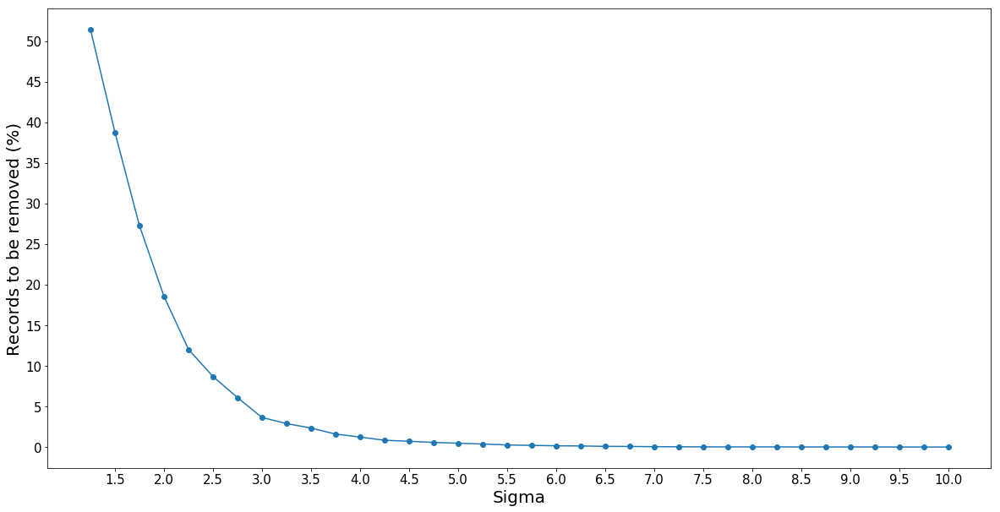

In [65]:
fig=plt.figure(figsize=(20,10))
plt.plot(np.arange(10, 1, -0.25), ratios, marker='o')
plt.xticks(np.arange(10, 1, -0.5), fontsize=15)
plt.yticks(np.arange(50, -1, -5), fontsize=15)
plt.xlabel('Sigma', fontsize=20)
plt.ylabel('Records to be removed (%)', fontsize=20)
plt.show()

### Sigma input

In [66]:
sigma=2.5

In [67]:
price_per_sqm_mask=(st_df.price_per_sqm.values<=sigma)&(st_df.price_per_sqm.values>=sigma*(-1))
log_price_mask=(st_df.log_price_in_huf.values<=sigma)&(st_df.log_price_in_huf.values>=sigma*(-1))
log_area_mask=(st_df.log_area_size.values<=sigma)&(st_df.log_area_size.values>=sigma*(-1))
lng_mask=(st_df.lng.values<=sigma)&(st_df.lng.values>=sigma*(-1))
lat_mask=(st_df.lat.values<=sigma)&(st_df.lat.values>=sigma*(-1))
total_records=len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask),num_feat])
filtered_records=len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask)&price_per_sqm_mask&log_price_mask&log_area_mask&lng_mask&lat_mask, num_feat])
ratio=filtered_records/total_records

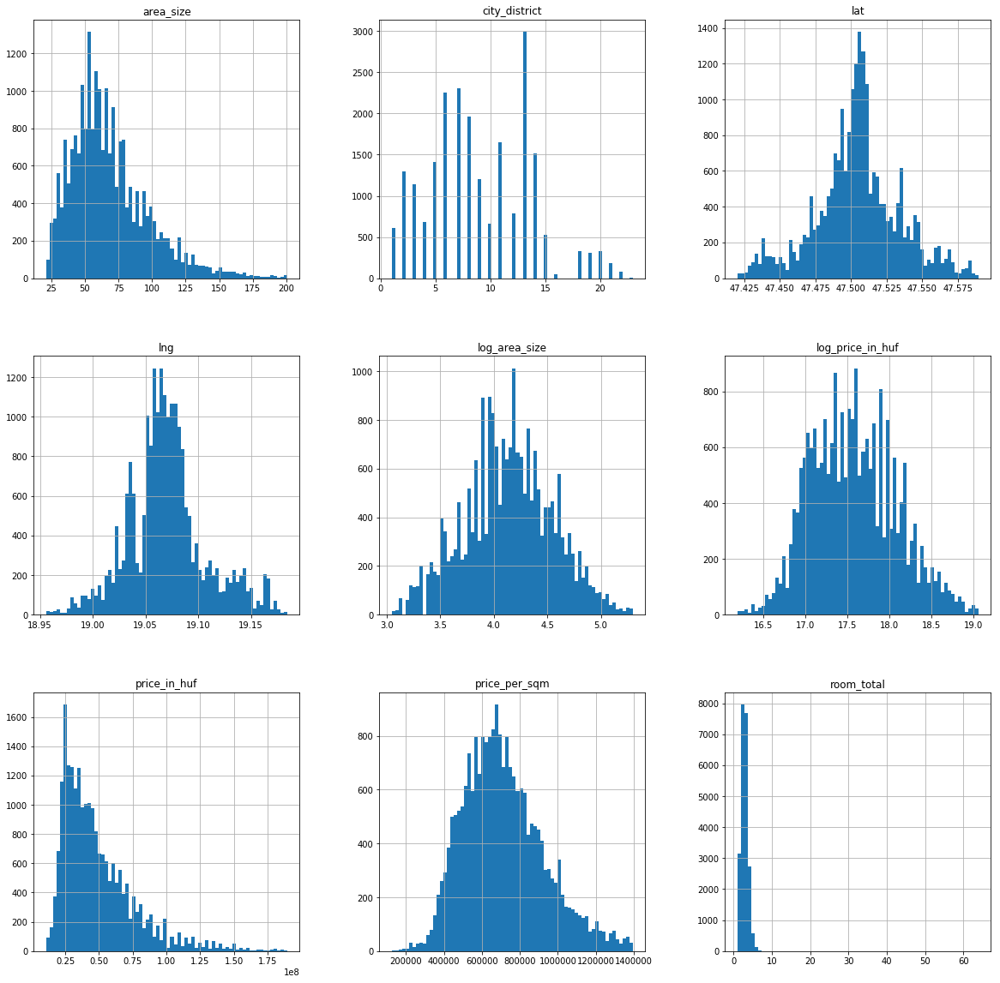

In [68]:
train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask)&price_per_sqm_mask&log_price_mask&log_area_mask&lng_mask&lat_mask, num_feat].hist(bins=70, figsize=(20,20))
plt.show()

In [69]:
len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask)&log_price_mask&log_area_mask, num_feat])/len(train_sale.loc[(street_num_mask|residental_park_mask|public_domains_mask)])

0.9766726795670712

### Eyeballing the heat map

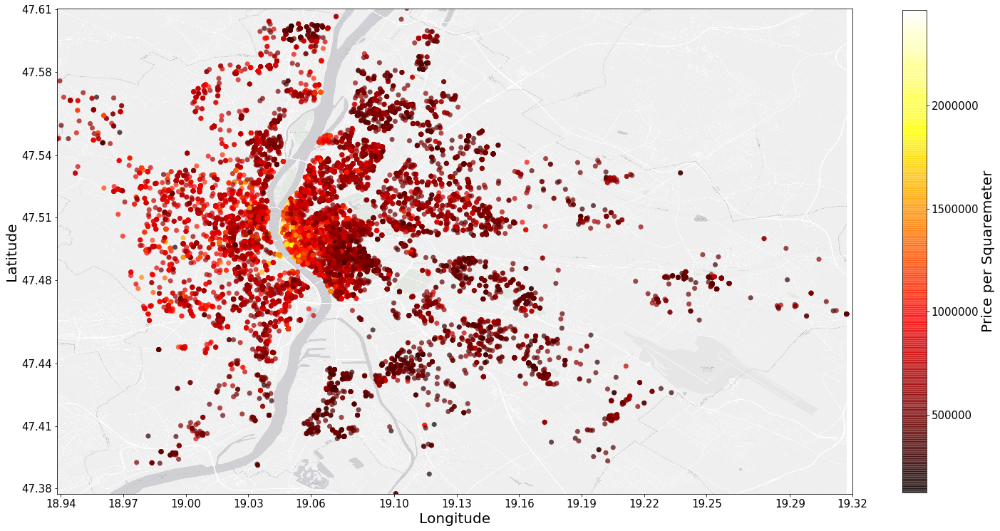

In [70]:
all_mask=(street_num_mask|residental_park_mask|public_domains_mask)&log_price_mask&log_area_mask
plot_scatter_map(x=train_sale.loc[all_mask, 'lng'],
                 y=train_sale.loc[all_mask, 'lat'],
                 c=train_sale.loc[all_mask, 'price_per_sqm'],
                 colormap='hot', c_bar_shrink=0.81,
                 xlabel='Longitude', ylabel='Latitude', clabel='Price per Squaremeter',
                 linewidth=0, s=50, alpha=0.7,
                 figsize=opt_fig_size, dpi=160)
plt.show()

Defining cleaned training dataset:

In [71]:
cl_train_sale=train_sale[all_mask]

Examine relationship between price - area_size

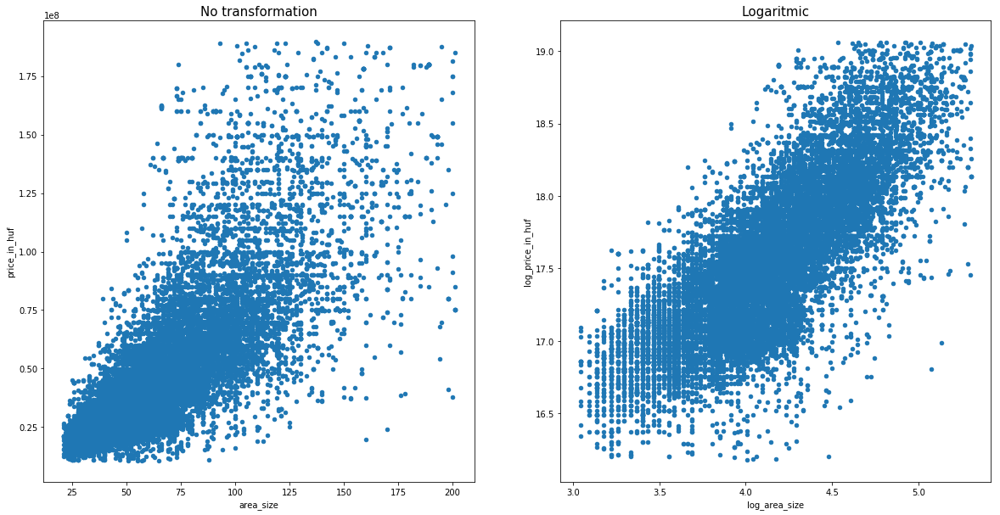

In [72]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20,10)
cl_train_sale.plot.scatter(x='area_size', y='price_in_huf', ax=axs[0])
cl_train_sale.plot.scatter(x='log_area_size', y='log_price_in_huf', ax=axs[1])
axs[0].set_title('No transformation', fontsize=15)
axs[1].set_title('Logaritmic', fontsize=15)
plt.show()

In [73]:
lr_log = linear_model.LinearRegression(fit_intercept=True)
lr = linear_model.LinearRegression(fit_intercept=True)

In [74]:
lr_log.fit(X=cl_train_sale[['log_area_size']], y=cl_train_sale['log_price_in_huf'])
lr.fit(X=cl_train_sale[['area_size']], y=cl_train_sale['price_in_huf'])

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [75]:
print('Area size - price elasticity is: {0:.2}%'.format(lr_log.coef_[0]))

Area size - price elasticity is: 0.99%


In [76]:
folds_n=100
cv_log=cross_val_score(estimator=lr_log, cv=folds_n, X=cl_train_sale[['log_area_size']], y=cl_train_sale['log_price_in_huf'])
cv=cross_val_score(estimator=lr, cv=folds_n, X=cl_train_sale[['area_size']], y=cl_train_sale['price_in_huf'])
print("Linear model R2 is: {0:%}".format(np.mean(cv)))
print("Log-log model R2 is: {0:%}".format(np.mean(cv_log)))

Linear model R2 is: 55.399259%
Log-log model R2 is: 58.042303%


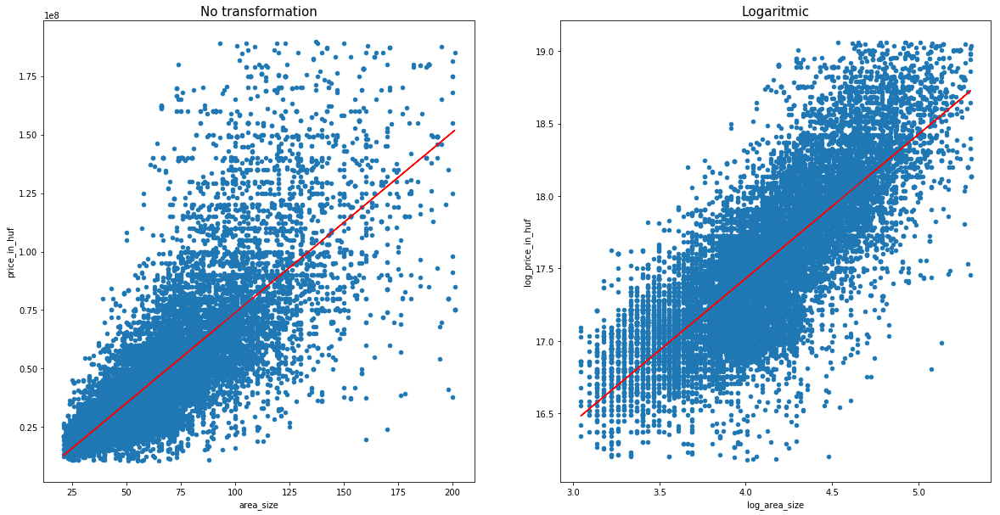

In [77]:
fig, axs = plt.subplots(1, 2)
fig.set_size_inches(20,10)
cl_train_sale.plot.scatter(x='area_size', y='price_in_huf', ax=axs[0])
cl_train_sale.plot.scatter(x='log_area_size', y='log_price_in_huf', ax=axs[1])
axs[0].plot(cl_train_sale.area_size, lr.predict(X=cl_train_sale[['area_size']]), c='r')
axs[1].plot(cl_train_sale.log_area_size, lr_log.predict(X=cl_train_sale[['log_area_size']]), c='r')
axs[0].set_title('No transformation', fontsize=15)
axs[1].set_title('Logaritmic', fontsize=15)
plt.show()

---

### Linear regression:

In [78]:
lin_reg = linear_model.LinearRegression(fit_intercept=True)

In [79]:
lin_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

R$^2$ on training set:

In [80]:
score = lin_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
score

0.15415563205769334

Average R$^2$ on cross validated data set with 10 folds:

In [81]:
cross_score = cross_val_score(cv=10, estimator=lin_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.14719619744359697, 0.040771325538198705)

Define boundaries for plotting:

In [82]:
boundaries_file_p = os.path.join(DATA_DIR, 'boundaries.csv')
boundaries_osm_q = os.path.join(SRC_DIR, 'boundaries_osm_query.txt')
boundaries = check_n_query_osm(boundaries_file_p, boundaries_osm_q, add_tag='postal_code')
min_gps=boundaries.min()
max_gps=boundaries.max()

In [83]:
X, Y, Z = create_grid(data_points=200, model=lin_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

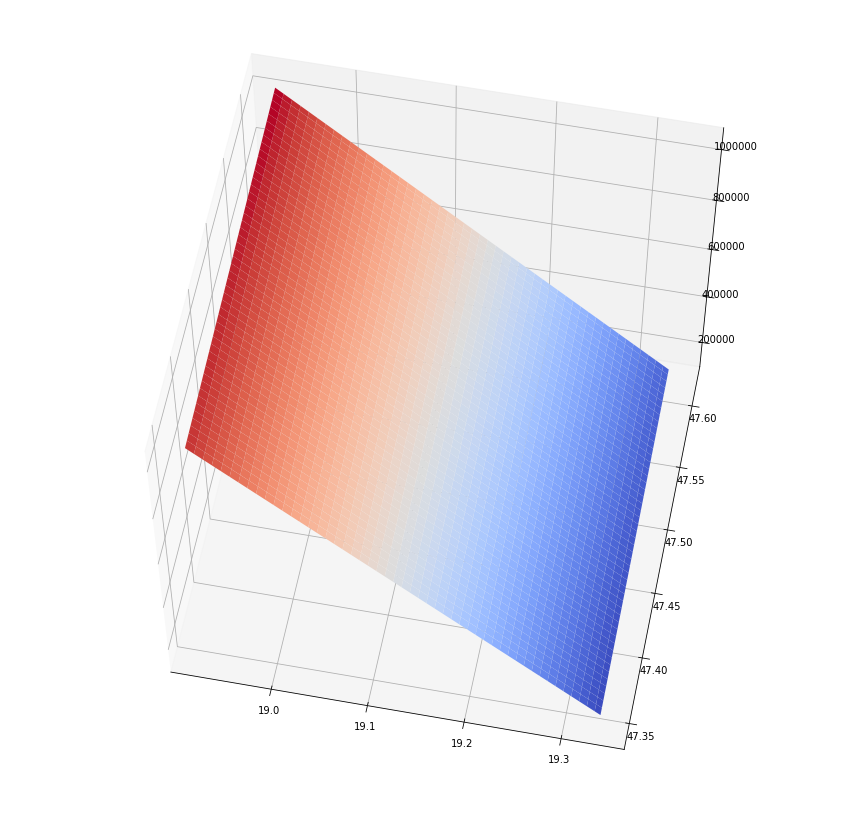

In [84]:
model_name='lin_model_R2_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Polynomial regression:
#### Hyperparameter:
- Degree of polynomial function

In [82]:
poly_reg = Pipeline([
        ('poly_features', PolynomialFeatures(include_bias=True)),
        ('lin_reg', linear_model.LinearRegression()),
    ])

In [77]:
gs = GridSearchCV(estimator=poly_reg, param_grid={'poly_features__degree':[*range(1, 17)]}, cv=10)

In [78]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=10, error_score='raise',
       estimator=Pipeline(memory=None,
     steps=[('poly_features', PolynomialFeatures(degree=1, include_bias=True, interaction_only=False)), ('lin_reg', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))]),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'poly_features__degree': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [79]:
gs.grid_scores_

[mean: 0.14720, std: 0.04077, params: {'poly_features__degree': 1},
 mean: 0.22686, std: 0.05234, params: {'poly_features__degree': 2},
 mean: 0.24978, std: 0.04415, params: {'poly_features__degree': 3},
 mean: 0.26529, std: 0.04273, params: {'poly_features__degree': 4},
 mean: 0.26846, std: 0.04135, params: {'poly_features__degree': 5},
 mean: 0.27276, std: 0.03817, params: {'poly_features__degree': 6},
 mean: 0.27496, std: 0.03424, params: {'poly_features__degree': 7},
 mean: 0.27277, std: 0.03997, params: {'poly_features__degree': 8},
 mean: 0.27349, std: 0.03993, params: {'poly_features__degree': 9},
 mean: 0.27276, std: 0.04013, params: {'poly_features__degree': 10},
 mean: 0.27265, std: 0.04017, params: {'poly_features__degree': 11},
 mean: 0.27258, std: 0.04008, params: {'poly_features__degree': 12},
 mean: 0.27241, std: 0.03989, params: {'poly_features__degree': 13},
 mean: 0.27267, std: 0.04017, params: {'poly_features__degree': 14},
 mean: 0.27290, std: 0.04020, params: {'pol

In [80]:
gs.best_params_

{'poly_features__degree': 7}

#### The best model:

In [113]:
poly_reg = Pipeline([
        ('poly_features', PolynomialFeatures(degree=7, include_bias=True)),
        ('lin_reg', linear_model.LinearRegression()),
    ])

In [114]:
poly_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('poly_features', PolynomialFeatures(degree=7, include_bias=True, interaction_only=False)), ('lin_reg', LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False))])

R$^2$ on training set:

In [115]:
score = poly_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
score

0.28009638243806556

Average R$^2$ on cross validated data set with 10 folds:

In [117]:
cross_score = cross_val_score(cv=10, estimator=poly_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale['price_per_sqm'])
cross_score.mean(), cross_score.std() 

(0.27496154817995266, 0.03424338795516304)

In [118]:
X, Y, Z = create_grid(data_points=200, model=poly_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

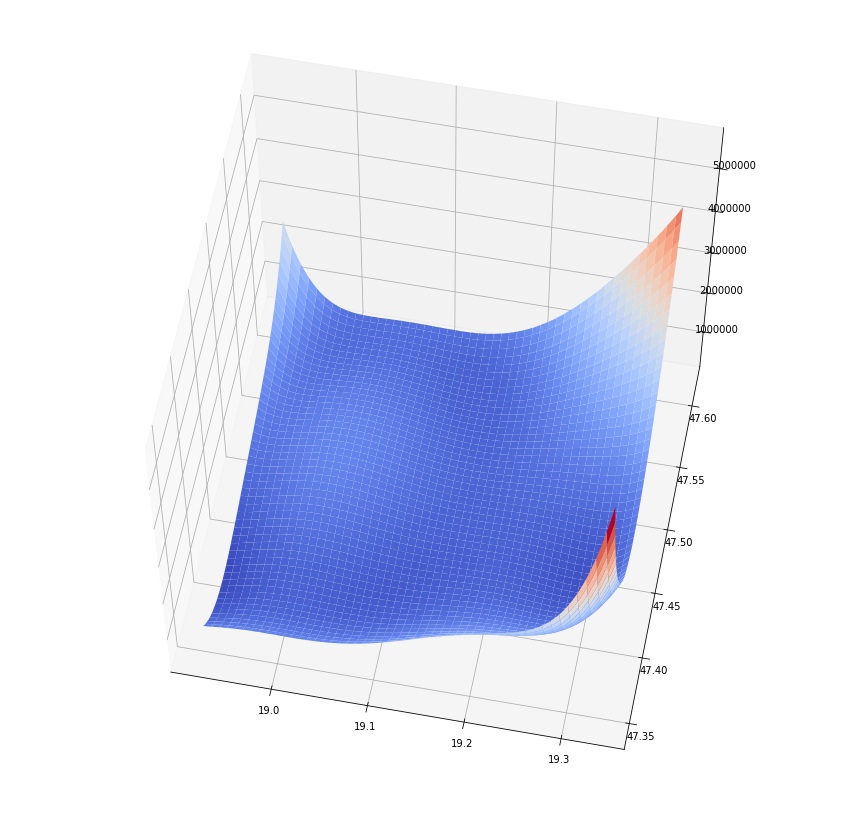

In [119]:
model_name='poly_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

---

### SVM Regression:
#### Hyperparameters:
Kernel: Gaussian Radial Basis function
- *C* as regularization/smoothing parameter
- *Gamma* defines kurtosis of the Gaussian curve

After tuning hyperparameter with GridSearch, I found that model performs the best with *C* = 10000 and *Gamma* paramter has a high impact on the overall performance 

#### Gamma = 1

In [93]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_1.pkl'))

In [94]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=1,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [95]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.3730155187015747

Average R$^2$ on cross validated data set with 10 folds:

In [96]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.3630701683422495, 0.04335354680483827)

In [98]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

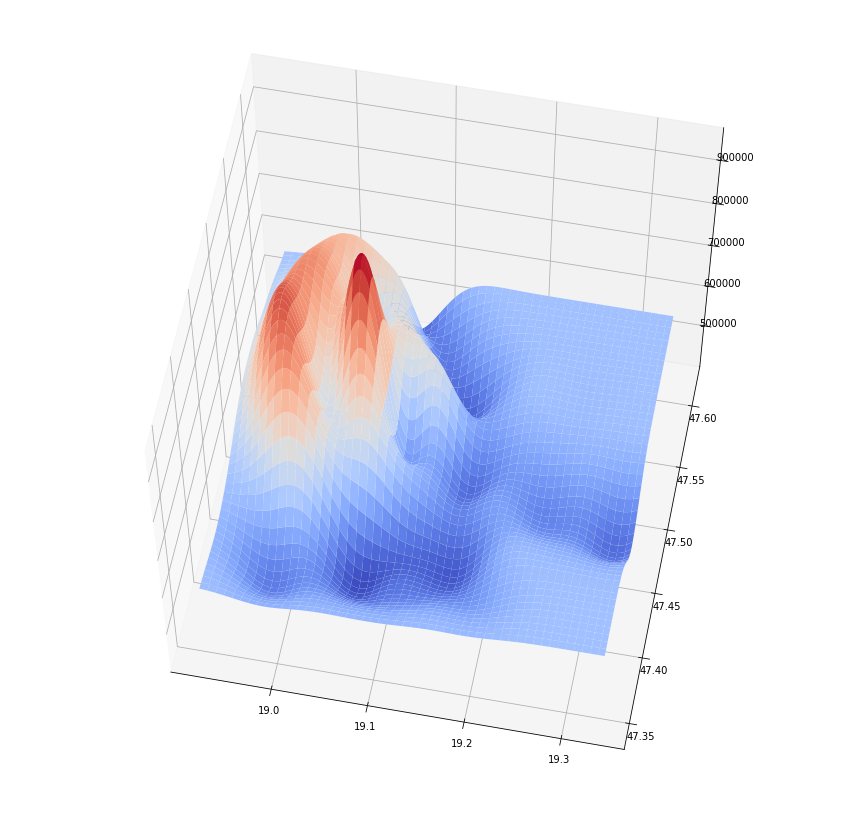

In [99]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 6

In [107]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_6.pkl'))

In [108]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=6,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [109]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.4493681493030904

Average R$^2$ on cross validated data set with 10 folds:

In [110]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.43397747569637624, 0.03824626428234185)

In [111]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

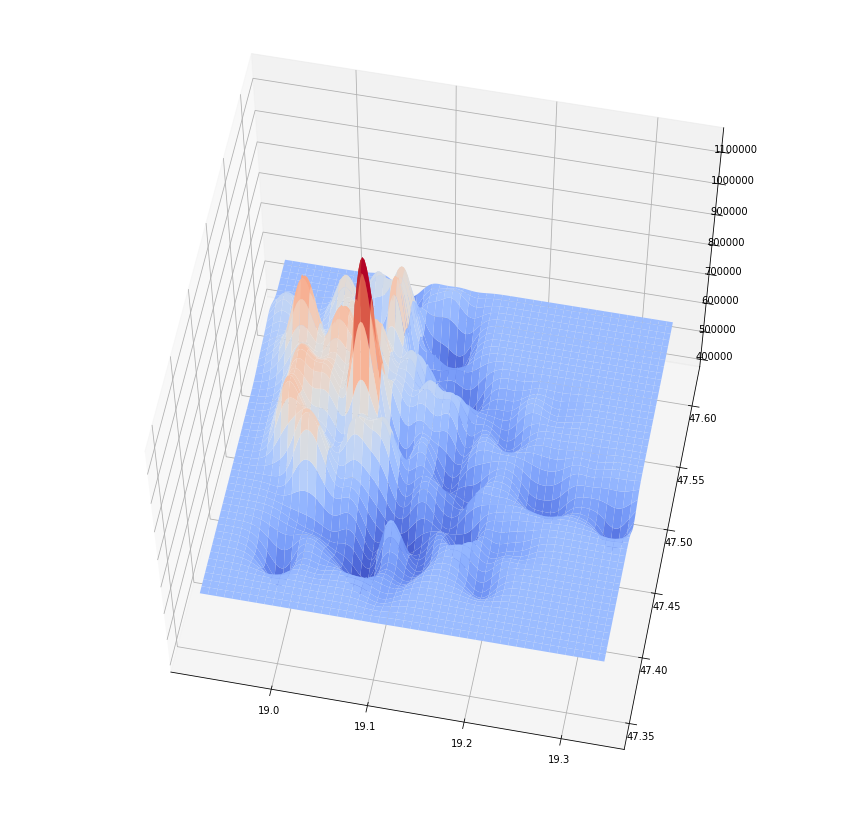

In [112]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 12

In [125]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_12.pkl'))

In [114]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=10000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=12,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [115]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.4613702652828109

Average R$^2$ on cross validated data set with 10 folds:

In [116]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.4430404881268283, 0.0370126380627983)

In [117]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

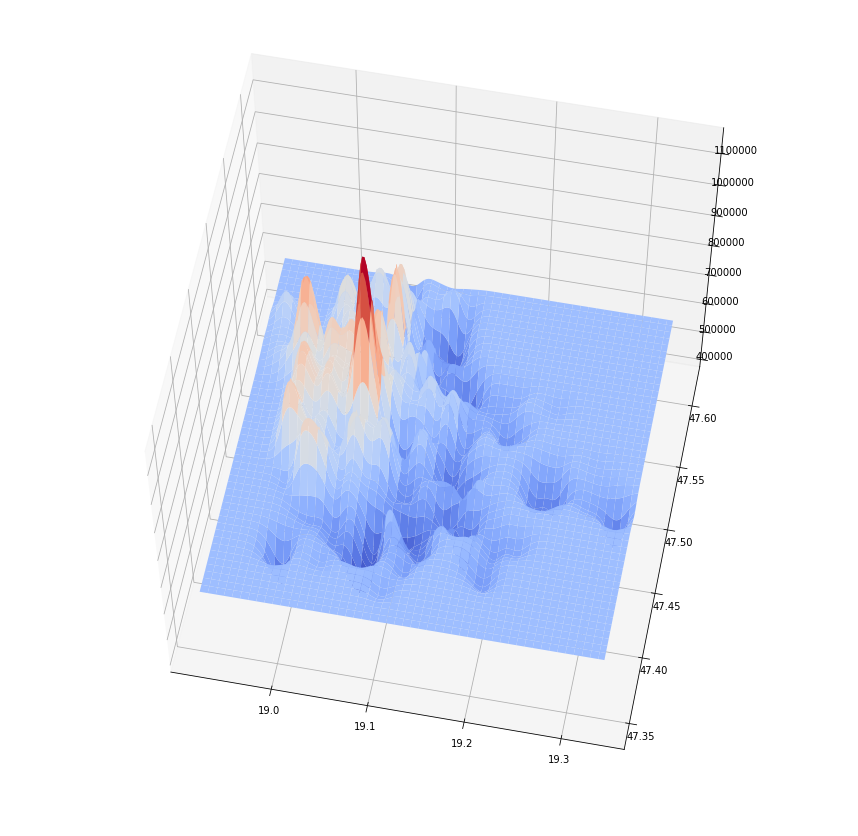

In [118]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

#### Gamma = 200

In [119]:
svm_reg = load_pkl(os.path.join(MODEL_DIR, 'svm_rbs_reg_gamma_200.pkl'))

In [120]:
svm_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

Pipeline(memory=None,
     steps=[('scaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('svr', SVR(C=210000, cache_size=200, coef0=0.0, degree=3, epsilon=1000, gamma=200,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False))])

R$^2$ on training set:

In [121]:
score = svm_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.596619927056365

Average R$^2$ on cross validated data set with 10 folds:

In [122]:
cross_score = cross_val_score(cv=10, estimator=svm_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean(), cross_score.std()

(0.5067777323136186, 0.046160124975261)

In [123]:
X, Y, Z = create_grid(data_points=200, model=svm_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

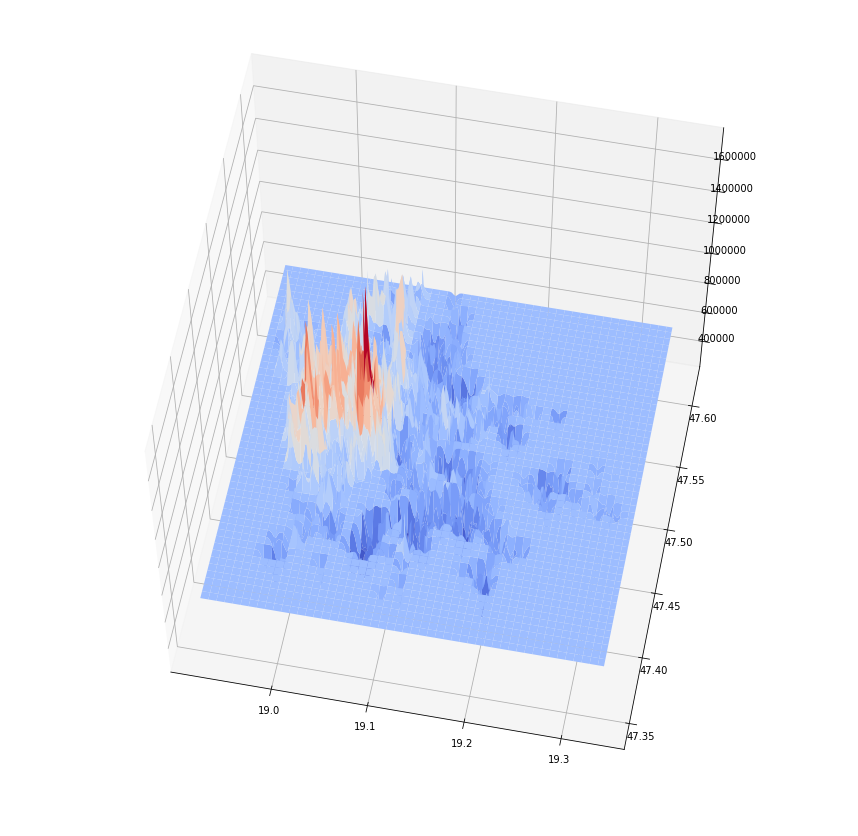

In [124]:
model_name='svm_model_{0:.0f}'.format(cross_score.mean()*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Decision Tree Regression:

In [148]:
from sklearn import kernel_approximation

In [150]:
from sklearn.tree import DecisionTreeRegressor

In [151]:
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor

Decision Tree Hyperparameters:
- max_depth
- min_samples_split
- min_samples_leaf (leaf_node: pure node, where gini/entrophy = 0)
- min_weight_fraction
- max_features
- max_leaf_nodes
- min_impurity_decrease
- min_impurity_split

In [184]:
email = Email(sender_email='tibor.szerenyi@gmail.com', receiver_email='tibor.szerenyi@gmail.com')

Type your password and press enter: ········


In [185]:
msg = 'Done'

In [309]:
tree_reg = DecisionTreeRegressor(min_samples_leaf = 10, min_samples_split = 10, max_depth=100)

In [306]:
gs = GridSearchCV(estimator=tree_reg, cv=10, param_grid={'max_depth': [*range(95, 156, 10)]})

In [307]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=10, error_score='raise',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=10,
           min_samples_split=10, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': [95, 105, 115, 125, 135, 145, 155]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [195]:
email.send(msg=msg)

In [308]:
gs.grid_scores_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:761: DeprecationWarning: The grid_scores_ attribute was deprecated in version 0.18 in favor of the more elaborate cv_results_ attribute. The grid_scores_ attribute will not be available from 0.20
  DeprecationWarning)


[mean: 0.53707, std: 0.04749, params: {'max_depth': 95},
 mean: 0.53712, std: 0.04758, params: {'max_depth': 105},
 mean: 0.53704, std: 0.04719, params: {'max_depth': 115},
 mean: 0.53696, std: 0.04788, params: {'max_depth': 125},
 mean: 0.53699, std: 0.04721, params: {'max_depth': 135},
 mean: 0.53691, std: 0.04788, params: {'max_depth': 145},
 mean: 0.53683, std: 0.04745, params: {'max_depth': 155}]

In [310]:
tree_reg = DecisionTreeRegressor(min_samples_leaf = 10, min_samples_split = 10, max_depth=100)

In [311]:
tree_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

DecisionTreeRegressor(criterion='mse', max_depth=100, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=10,
           min_samples_split=10, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [312]:
score = tree_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.6443864838385429

In [313]:
cv = cross_val_score(cv=50, estimator=tree_reg, n_jobs=-1, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

In [212]:
tree_reg.feature_importances_

array([0.35704424, 0.64295576])

In [314]:
cv.mean(), cv.std()

(0.541056803633749, 0.07499865071043915)

In [315]:
X, Y, Z = create_grid(data_points=200, model=tree_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

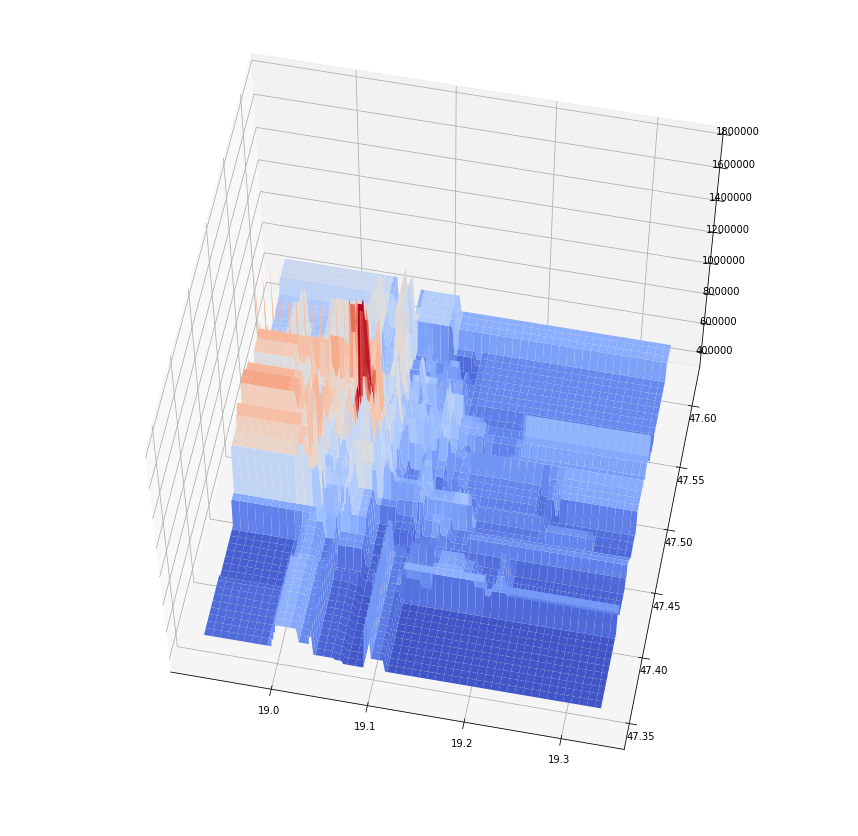

In [316]:
model_name='tree_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Random Forest Regression:

In [317]:
forest_reg = RandomForestRegressor(min_samples_leaf= 10, min_samples_split= 10, max_depth=100, bootstrap=True, oob_score=True, n_estimators=100, n_jobs=-1)

In [318]:
forest_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=100,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=10, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
           oob_score=True, random_state=None, verbose=0, warm_start=False)

In [319]:
score = forest_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.6426981101502919

In [320]:
forest_reg.oob_score_

0.5908704929881766

In [321]:
X, Y, Z = create_grid(data_points=200, model=forest_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

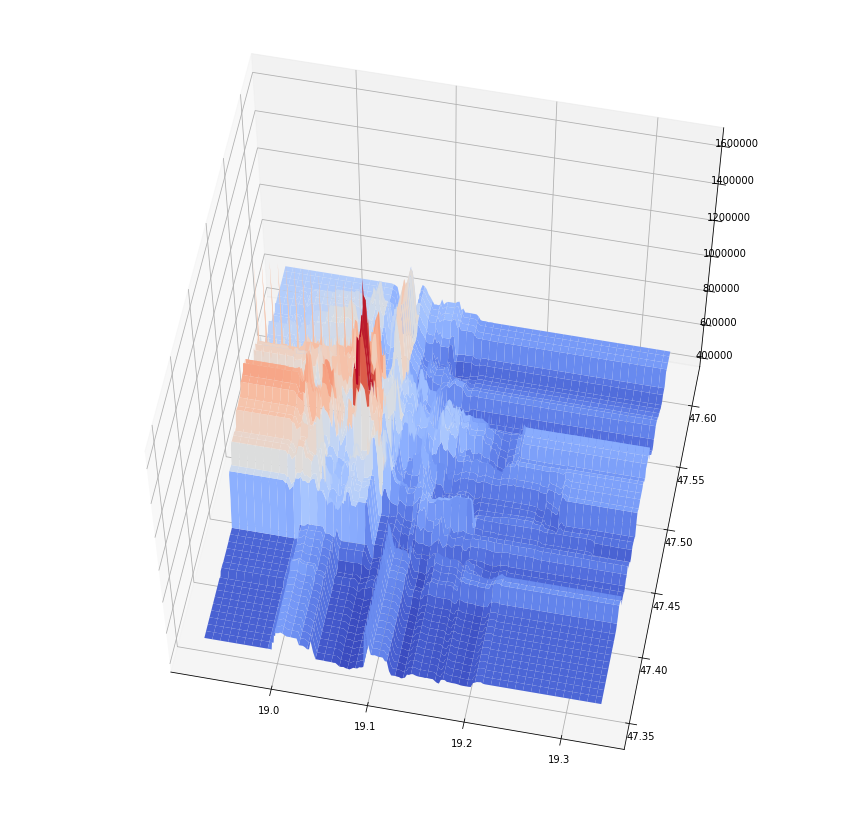

In [322]:
model_name='forest_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### Boosting Regression:

In [365]:
tree_reg = DecisionTreeRegressor(max_depth=10)

In [366]:
ada_reg = AdaBoostRegressor(base_estimator=tree_reg, n_estimators=10000)

In [367]:
ada_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best'),
         learning_rate=1.0, loss='linear', n_estimators=10000,
         random_state=None)

In [368]:
score = ada_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.570510375750046

In [369]:
cross_score = cross_val_score(cv=50, estimator=ada_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
print(cross_score.mean(), cross_score.std())
cross_score

0.5055655500127584 0.07963633814534492


array([0.3532032 , 0.43734901, 0.53230041, 0.57402226, 0.54585968,
       0.5003556 , 0.44879914, 0.48093349, 0.54657575, 0.53479494,
       0.50124776, 0.62834759, 0.55379002, 0.58738365, 0.50090976,
       0.56937595, 0.54929287, 0.49544154, 0.55771674, 0.4925342 ,
       0.46065297, 0.48762092, 0.4627915 , 0.39917699, 0.63869082,
       0.59228342, 0.55473692, 0.58512334, 0.54444573, 0.59179015,
       0.58723848, 0.54065734, 0.54747206, 0.54298636, 0.5617945 ,
       0.49690848, 0.5550763 , 0.5984318 , 0.38619054, 0.48212215,
       0.49677763, 0.4493129 , 0.40208389, 0.49712375, 0.3222787 ,
       0.60524227, 0.39859582, 0.4740225 , 0.30559467, 0.32082103])

In [363]:
X, Y, Z = create_grid(data_points=200, model=ada_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

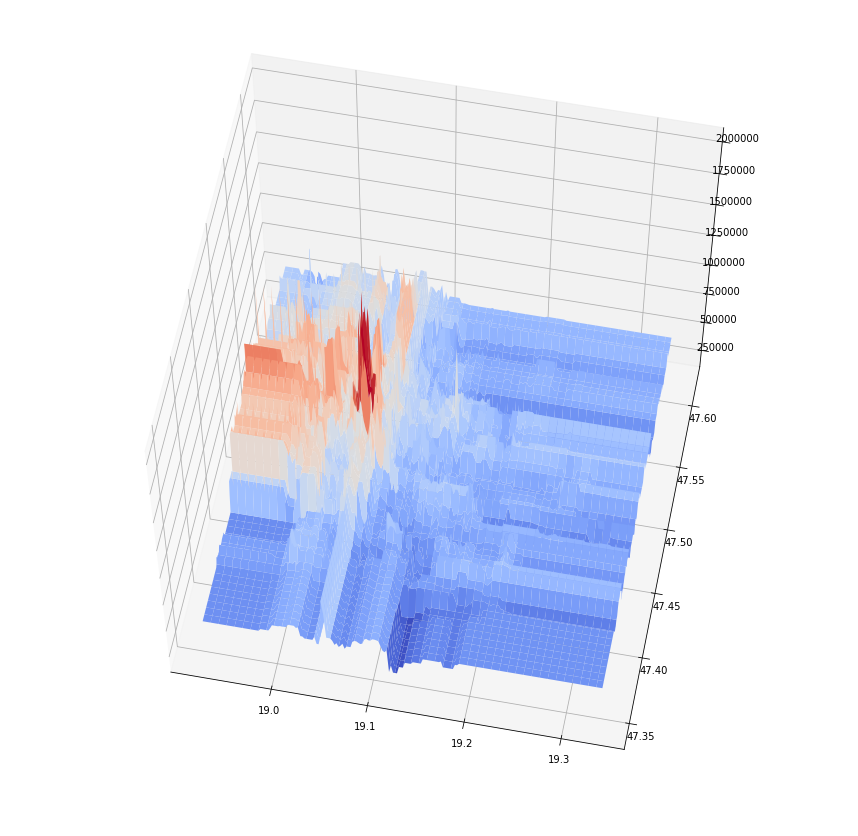

In [364]:
model_name='ada_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=False, dir_name=IMG_DIR, model_name=model_name)
plt.show()

### K-Neighbors Regression:

In [204]:
neigh_reg = load_pkl(os.path.join(MODEL_DIR, 'neigh_reg.pkl'))

In [ ]:
neigh_reg = KNeighborsRegressor(weights='distance', p=2, n_jobs=-1, n_neighbors=88)

In [ ]:
gs = GridSearchCV(estimator=neigh_reg, param_grid={'n_neighbors':[64, 80, 84, 88, 92, 96, 112, 128, 256, 512], 'weights':['distance'], 'p':[2]}, n_jobs=-1, cv=50)

In [351]:
gs.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

GridSearchCV(cv=50, error_score='raise',
       estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
          weights='distance'),
       fit_params={}, iid=True, n_jobs=-1,
       param_grid={'n_neighbors': [64, 80, 84, 88, 92, 96, 112, 128, 256, 512], 'weights': ['distance'], 'p': [2]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [352]:
gs.grid_scores_

[mean: 0.56614, std: 0.07968, params: {'n_neighbors': 64, 'p': 2, 'weights': 'distance'},
 mean: 0.56658, std: 0.07938, params: {'n_neighbors': 80, 'p': 2, 'weights': 'distance'},
 mean: 0.56661, std: 0.07940, params: {'n_neighbors': 84, 'p': 2, 'weights': 'distance'},
 mean: 0.56670, std: 0.07925, params: {'n_neighbors': 88, 'p': 2, 'weights': 'distance'},
 mean: 0.56667, std: 0.07934, params: {'n_neighbors': 92, 'p': 2, 'weights': 'distance'},
 mean: 0.56673, std: 0.07944, params: {'n_neighbors': 96, 'p': 2, 'weights': 'distance'},
 mean: 0.56658, std: 0.07962, params: {'n_neighbors': 112, 'p': 2, 'weights': 'distance'},
 mean: 0.56661, std: 0.07954, params: {'n_neighbors': 128, 'p': 2, 'weights': 'distance'},
 mean: 0.56606, std: 0.07940, params: {'n_neighbors': 256, 'p': 2, 'weights': 'distance'},
 mean: 0.56508, std: 0.07997, params: {'n_neighbors': 512, 'p': 2, 'weights': 'distance'}]

In [194]:
neigh_reg = KNeighborsRegressor(weights='distance', p=2, n_jobs=-1, n_neighbors=88)

In [206]:
neigh_reg.fit(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=-1, n_neighbors=88, p=2,
          weights='distance')

In [209]:
cross_score = cross_val_score(cv=10, estimator=neigh_reg, X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
cross_score.mean()

0.5541891988138374

In [208]:
score = neigh_reg.score(X=cl_train_sale[['lat', 'lng']], y=cl_train_sale.price_per_sqm)
score

0.7178516332293401

In [197]:
X, Y, Z = create_grid(data_points=200, model=neigh_reg, x_first_feature=False,
            x_max=max_gps['lng'], x_min=min_gps['lng'], y_max=max_gps['lat'], y_min=min_gps['lat'])

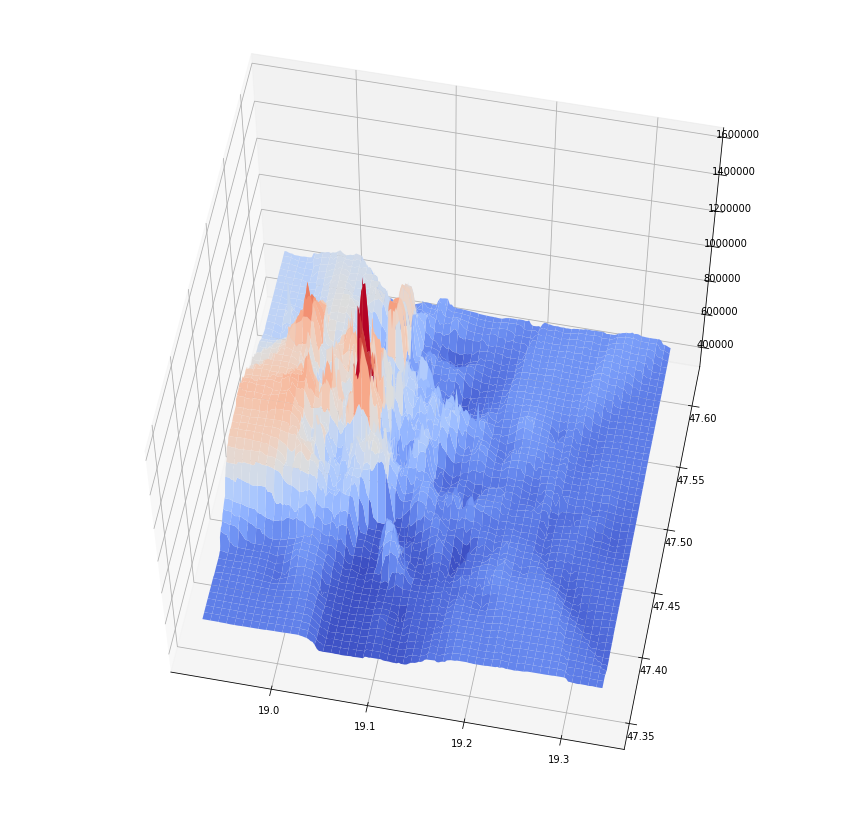

In [198]:
model_name='neigh_model_{0:.0f}'.format(score*100)
plot_3d_surface(X=X, Y=Y, Z=Z, figsize=(15,15), elevation=60, rotation=-79, saving=True, dir_name=IMG_DIR, model_name=model_name)
plt.show()

In [736]:
price_per_sqm = price_per_sqm_reg

In [735]:
price_per_sqm = price_per_sqm_cls * price_per_sqm_reg

In [732]:
perc = 6
price_per_sqm[price_per_sqm==0] = np.mean([np.min(price_per_sqm_reg), np.percentile(price_per_sqm_reg, perc)])

In [727]:
price_per_sqm[price_per_sqm==0] = 0

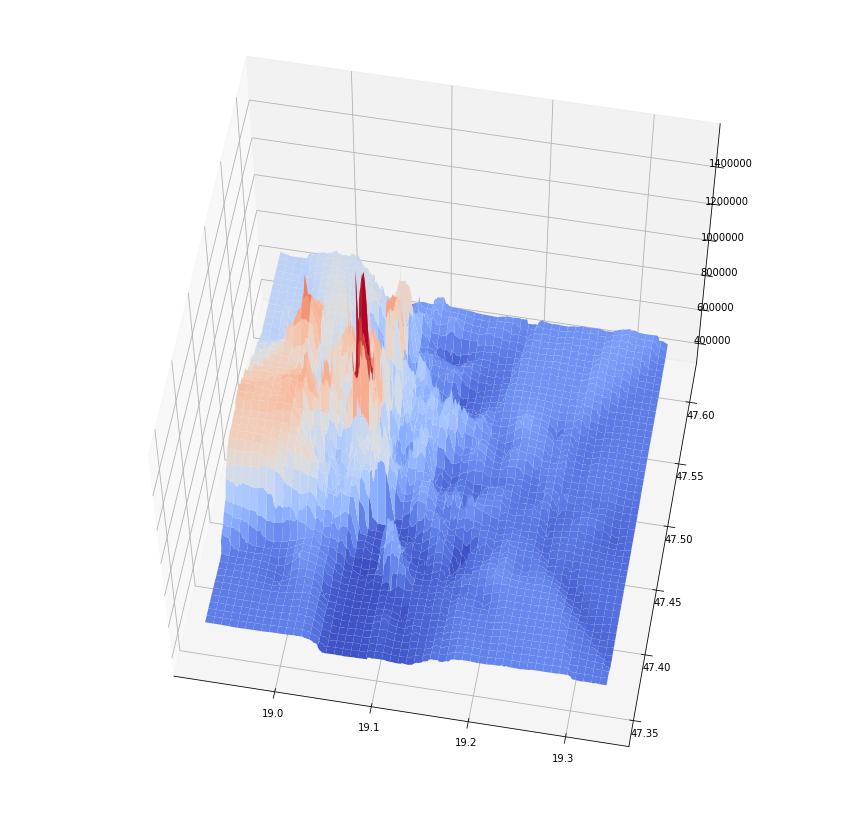

In [737]:
plot_3d_surface(lng, lat, price_per_sqm, rotation=-80, elevation=60, saving=True, dir_name=IMG_DIR, model_name='neighbors')
plt.show()

---

### Classification
- Train a model, which can distinguish between inhabited and uninhabited areas in Budapest
    1. Get the coordinates of the rivers, islands in Budapest, source: OpenStreetMap
    2. Combine new dataset with Real Estate dataset
    3. Split the dataset for training and test set

In [224]:
buda_districts=[1,2,3,11,12,22]
csepel_districts=[21]
pest_districts=[4, 5, 6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 18, 19, 20, 23]

In [241]:
agglomeration_file_p = os.path.join(DATA_DIR, 'agglomeration.csv')
agglomeration_osm_q = os.path.join(SRC_DIR, 'agglomeration_osm_query.txt')
agglomeration = check_n_query_osm(agglomeration_file_p, agglomeration_osm_q, add_tag='name')

In [242]:
agglomeration['inhabited'] = 'inhabited_agglomeration'

In [85]:
uninhabited_file_p = os.path.join(DATA_DIR, 'uninhabited.csv')
uninhabited_osm_q = os.path.join(SRC_DIR, 'uninhabited_osm_query.txt')
uninhabited = check_n_query_osm(uninhabited_file_p, uninhabited_osm_q)

In [244]:
uninhabited['inhabited'] = 'uninhabited'

In [75]:
boundaries_file_p = os.path.join(DATA_DIR, 'boundaries.csv')
boundaries_osm_q = os.path.join(SRC_DIR, 'boundaries_osm_query.txt')
boundaries = check_n_query_osm(boundaries_file_p, boundaries_osm_q, add_tag='postal_code')

In [90]:
boundaries['city_district'] = boundaries['postal_code'].apply(lambda c: int(str(c)[1:-1]))
boundaries['inhabited'] = 'inhabited_budapest'

In [247]:
print(len(boundaries))
print(len(agglomeration))
print(len(uninhabited))

17728
6426
15792


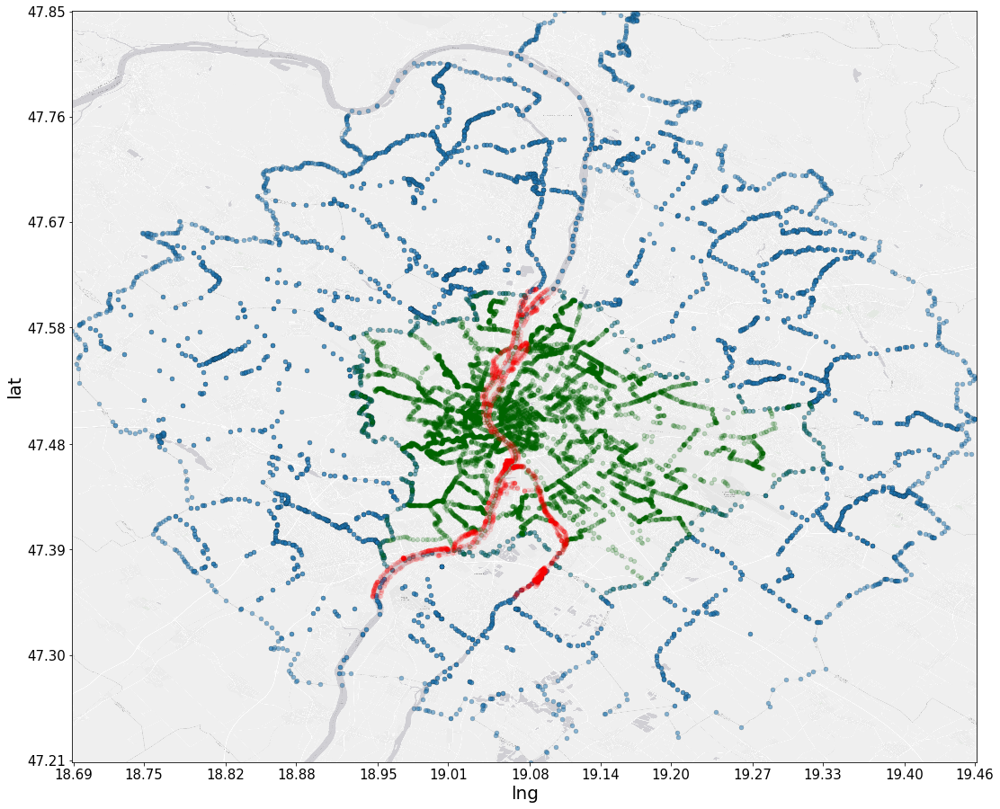

In [146]:
fig, ax = plot_scatter_map(x=agglomeration['lng'], y=agglomeration['lat'], xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, dpi=160, alpha=0.5)
boundaries.plot(kind='scatter', x='lng', y='lat', ax=ax, c='darkgreen', alpha=0.1)
uninhabited.plot(kind='scatter', x='lng', y='lat', ax=ax, c='r', alpha=0.1)

Filter out common boundaries among defined areas:

In [256]:
cols=['lat', 'lng', 'inhabited']
boundaries_not_in_uninhabited=~boundaries.lat.isin(uninhabited.lat)&~boundaries.lng.isin(uninhabited.lng)
boundaries_not_in_agglomeration=~boundaries.lat.isin(agglomeration.lat)&~boundaries.lng.isin(agglomeration.lng)
agglomeration_not_in_uninhabited=~agglomeration.lat.isin(uninhabited.lat)&~agglomeration.lng.isin(uninhabited.lng)

In [257]:
listings['inhabited'] = 'inhabited_budapest'

Combined dataset:

In [258]:
budapest = pd.concat([boundaries.loc[boundaries_not_in_uninhabited&boundaries_not_in_agglomeration, cols],
                      agglomeration.loc[agglomeration_not_in_uninhabited, cols],
                      uninhabited.loc[:,cols],
                      listings.loc[:, cols]]).drop_duplicates()

In [261]:
min_gps=boundaries.min()
max_gps=boundaries.max()
bp_min_lng_mask=(min_gps['lng']<=budapest.lng)&(budapest.lng<=max_gps['lng'])
bp_max_lat_mask=(min_gps['lat']<=budapest.lat)&(budapest.lat<=max_gps['lat'])

In [262]:
budapest=budapest[bp_min_lng_mask&bp_max_lat_mask]

In [277]:
budapest['inhabited_factor'] = budapest.inhabited.factorize()[0]

In [278]:
budapest[['inhabited', 'inhabited_factor']].drop_duplicates()

,inhabited,inhabited_factor
0,inhabited_budapest,0
46,inhabited_agglomeration,1
0,uninhabited,2


In [274]:
mpl.cm.Accent.colors[-3:]

((0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 (0.4, 0.4, 0.4))

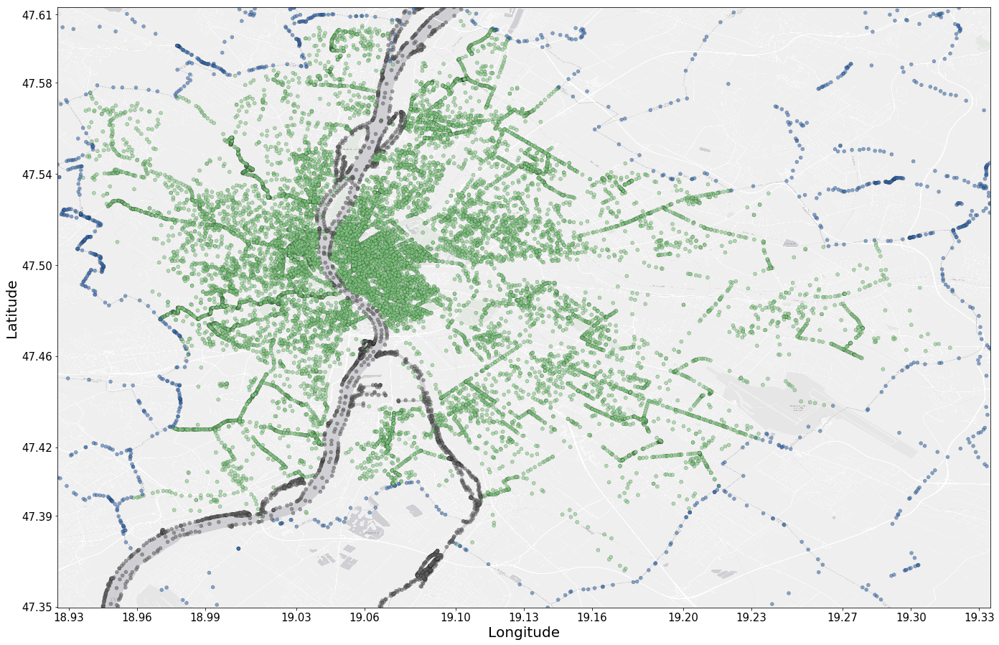

In [279]:
fig, ax = plot_scatter_map(x=budapest['lng'], y=budapest['lat'], c=budapest['inhabited_factor'], colormap='Accent', cbar=False, xlabel='Longitude', ylabel='Latitude', figsize=opt_fig_size, dpi=160, alpha=0.6)

Relative frequency a class:

In [289]:
budapest[['inhabited', 'inhabited_factor']].groupby('inhabited').count()/len(budapest)

,inhabited_factor
inhabited,
inhabited_agglomeration,0.058068
inhabited_budapest,0.831166
uninhabited,0.110766


Split for train and test set:

In [298]:
X_train_bp, X_test_bp, y_train_bp, y_test_bp = train_test_split(budapest[['lat', 'lng']].values,
                                                                budapest.inhabited.values,
                                                                random_state=777,
                                                                test_size=0.2,
                                                                train_size=0.8,
                                                                stratify=budapest.inhabited.values)

In [299]:
len(X_train_bp)/len(budapest), len(X_test_bp)/len(budapest)

(0.8, 0.2)

Stratified sampling:

In [300]:
counter=Counter(y_train_bp)

In [301]:
priori_p = {k:v/len(y_train_bp) for k, v in counter.items()}
priori_p

{'inhabited_agglomeration': 0.05810739668333772,
 'inhabited_budapest': 0.8311397736246381,
 'uninhabited': 0.11075282969202421}

In [ ]:
neigh_cls = KNeighborsClassifier(weights='distance', p=2, n_jobs=-1, n_neighbors=5)

In [ ]:
gs = GridSearchCV(estimator=neigh_cls, param_grid={'n_neighbors':[1,3,5,9,17], 'weights':['distance'], 'p':[2]}, n_jobs=-1, cv=15)

In [ ]:
gs.fit(X=X_train_bp, y=y_train_bp)

In [309]:
gs.grid_scores_

In [309]:
neigh_cls = KNeighborsClassifier(weights='distance', p=2, n_jobs=-1, n_neighbors=5)

In [311]:
neigh_cls.fit(X=X_train_bp, y=y_train_bp)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
           weights='distance')

In [313]:
y_hat = neigh_cls.predict(X=X_test_bp)

In [314]:
post_p = {k:v/len(y_hat) for k, v in Counter(y_hat).items()}
post_p

{'inhabited_agglomeration': 0.056593840484337986,
 'inhabited_budapest': 0.8315346143722032,
 'uninhabited': 0.1118715451434588}

In [319]:
cv = cross_val_score(estimator=neigh_cls, cv=100, X=X_train_bp, y=y_train_bp)

In [320]:
np.mean(cv)

0.9865775197798418

In [199]:
neigh_cls.predict(X=[[47.4902,19.0472]])

array(['uninhabited'], dtype=object)

---

In [ ]:
import seaborn as sns

In [ ]:
sns.distplot()

In [ ]:
data=train_sale.loc[(train_sale.lng==top_10.iloc[0].name[0])&(train_sale.lat==top_10.iloc[0].name[1]), ['price_in_huf', 'area_size', 'room_lt_12_sqm', 'room_ge_12_sqm']]
scatter_matrix(data, figsize=(20,20), hist_kwds={'bins':30})
plt.show()

In [ ]:
import mpld3

In [ ]:
import plotly
plotly.offline.init_notebook_mode()

In [ ]:
plt.scatter(x=raw.loc[raw.listing_type=='for-sale' ,'lng'].values,
            y=raw.loc[raw.listing_type=='for-sale' ,'lat'].values, alpha=1, s=25, marker='o', color='b')
# fig=plt.gcf()
# mpld3.display(fig)
pfig = plotly.tools.mpl_to_plotly(plt.gcf())
plotly.offline.iplot(pfig)

In [ ]:
plt.scatter(x=danube.lng.values, y=danube.lat.values)